# Import packages

In [39]:
import os
import re
import cv2
import glob
import json
import random
import shutil
import operator
import requests

import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from imutils import paths
from shutil import copyfile

# Import matplotlib modules
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Import sklearn modules
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, auc, roc_curve

# Import tensorflow and keras modules
import tensorflow as tf

import keras
from keras.applications import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, Sequential
from keras.layers import Activation,Conv2D, Dense, Dropout, Flatten
from keras.layers import GlobalAveragePooling2D, Input, MaxPooling2D, ZeroPadding2D
from keras.layers.normalization import BatchNormalization
from keras import regularizers
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [40]:
!pip install keras_applications
!pip install keras_vggface
!pip install mtcnn

import keras_vggface
from mtcnn import MTCNN

In [41]:
cd 'drive/My Drive/Cafe'

[Errno 2] No such file or directory: 'drive/My Drive/Cafe'
/content/drive/My Drive/Cafe/google_scrape


## Utility Functions

In [56]:
model_names = ["google1", "google2", "google3", "google4", "google5"]
class_labels = {0: "sip!",
                1: "skip :("}


def load_image(path):
    '''
    This function loads an image into a CV2 image from a specified path.
    The image is also converted from BGR to RGB.

    Inputs:
    -------------------------
    path: str, the local filepath of the the image


    Returns:
    -------------------------
    img: cv2 image / 3D array

    '''
    img = cv2.imread(path)                      # Read in image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    return img


def display_many(paths, num_to_plot=25, results=[None, None], randomize=False):
    '''
    This function displays many images in a grid-like pattern on a single figure.

    Inputs:
    -------------------------
    paths: [str, str, ...], list of filepaths containing images to display
    num_to_plot: int (default = 25)
        * the number of images to display in the figure
        * multiples of 5 work best, as the figure will always have 5 columns
    results: [scores, classes]
        * scores: 
            ** list of sip scores corresponding to the images located in the
               `paths` parameter.
            ** scores are the first element of the output of the keras models
            ** ex. [0.56, 0.40, 0.97, 0.22, ...]
        * classes:
            ** list of the true labels corresponding to the images located in the
               `paths` parameter/
            ** ex. ['sip!', 'skip :(', 'sip !', 'skip :(', ...]
    randomize: boolean (default = False)
        * whether or not to randomize the files before taking a subset of size
          `num_to_plot` to plot


    Returns:
    -------------------------
    None (figure is displayed in-function using fig.show())
    
    '''
    # Calculate the number of rows needed for the plot
    n_cols = 5
    n_rows = num_to_plot // n_cols
    row_height = 3
    if results[0]:
        row_height = 7
    
    if randomize:
        # Randomly select num_to_plot image paths
        idx = np.arange(len(imgs))
        idx = np.random.choice(idx, num_to_plot)
        paths = np.array(paths)[idx]

        # If results are provided, get the corresponding values
        if results[0]:
            scores = results[0][idx]
            classes = results[1][idx]
    else:
        # Select the first num_to_plot image paths
        paths = paths[:num_to_plot]

        # If results are provided, get the corresponding values
        if results[0]:
            scores = results[0][:num_to_plot]
            classes = results[1][:num_to_plot]

    # Load the images and resize to (256, 256) with padding
    imgs = [load_image(p) for p in paths]
    imgs = [resize_with_pad(img, 256) for img in imgs]

    # Plot the images
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, row_height*n_rows))
    for i, axes in enumerate(ax.flatten()):
        axes.imshow(imgs[i])
        axes.set_yticks([])     # Remove yticks
        axes.set_xticks([])     # Remove xticks

        # If results are provided, display them in the title
        if results[0]:
            axes.set_title("Sip match: {:.2%}\nActual: {}".format(scores[i], class_labels[classes[i]]))
    
    # Format the whitespace between images
    if results[0]: fig.subplots_adjust(wspace=0, hspace=0.3)
    else:          
        fig.tight_layout()
        fig.subplots_adjust(wspace=0, hspace=0)

    # Show the figure
    fig.show()
    return


def resize_with_pad(img, padded_size):
    '''
    This function takes an image and scales it to a square image with 
    height = width = padded_size. 
    
    The larger dimension of the original image is scaled to padded_size while
    maintaining the original aspect ratio. The scaled image is then padded such
    that the smaller dimension is now also `padded_size`. 
    
    The padded pixels are black (0, 0, 0).

    Inputs:
    -------------------------
    img: cv2 image / 2D array / 3D array
    padded_size: int
        * the number of pixels of the new height and width of the scaled image

    Returns:
    -------------------------
    new_img: cv2 image / 2D array / 3D array
    
    '''
    # Get height and width of the original image
    height, width = img.shape[:2]

    # Find the ratio between padded_size and the largest dimension
    ratio = padded_size / max(height, width)

    # Scale up the width and height while maintaining the original aspect ratio
    padded_width = int(width * ratio)
    padded_height = int(height * ratio)

    # Resize the image
    img = cv2.resize(img, (padded_width, padded_height))

    # Calculate the padding required to make the scaled image a square
    delta_w = padded_size - padded_width
    delta_h = padded_size - padded_height
    top, bottom = delta_h//2, delta_h-(delta_h//2)
    left, right = delta_w//2, delta_w-(delta_w//2)

    # Pad the image
    color = [0, 0, 0]
    new_img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT,
        value=color)
    return new_img


def get_face(img):
    '''
    This function takes an image and locates all faces present. 
    One face is selected, and the image is cropped to just include that face. 
    The cropped image is scaled to (256, 256) with padding.
    
    The cropped image and the "patch" of the face location in the original image
    is returned.

    If no faces were found, the original image and None are returned.

    This function is based off code from 
    https://machinelearningmastery.com/how-to-develop-a-face-recognition-system-using-facenet-in-keras-and-an-svm-classifier/

    Inputs:
    -------------------------
    img: cv2 image / 2D array / 3D array

    Returns:
    -------------------------
    square_face: cv2 image / 2D array / 3D array
        * the cropped image containing the face (padded to (256, 256))
        * if no faces were found, the original image is returned

    face_patch: matplotlib.patches.Rectangle
        * the location of the returned face in the original image
        * if no faces were found, None is returned 
    
    '''
    # Create the detector, using default weights
    detector = MTCNN()

    # Detect faces in the image
    results = detector.detect_faces(img)

    # Extract the bounding box from the first face
    try:
        x1, y1, width, height = results[0]['box']
        x1 = max(x1, 0)
        y1 = max(y1, 0)
        x2, y2 = x1 + width, y1 + height
    
    # If no faces are found, return the original image and None
    except: 
        return img, None

    # Extract the face
    face = img[y1:y2, x1:x2]
    face_patch = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='r',facecolor='none')
    
    # Resize and pad the face to be a 256x256 square image
    square_face = resize_with_pad(face, 256)

    return square_face, face_patch


def plot_with_box(img, patch):
    '''
    This function plots an image and patch on the same figure.

    Inputs:
    -------------------------
    imgs: cv2 image / 2D array / 3D array
    patches: matplotlib.patches.Rectangle object

    Returns:
    -------------------------
    fig: matplotlib.pyplot.figure
    '''

    fig, ax = plt.subplots(1)   # Create figure
    ax.imshow(img)              # Display image
    ax.add_patch(patch)         # Add patch
    fig.show()                  # Show figure

    return fig

def plot_multiple_with_box(imgs, face_patches):
    '''
    This function displays all images and their corresponding patches in a 
    grid-like pattern on the same figure.

    Inputs:
    -------------------------
    imgs: list of cv2 images / 2D arrays / 3D arrays
    patches: list of matplotlib.patches.Rectangle objects

    Returns:
    -------------------------
    fig: matplotlib.pyplot.figure
    '''
    # Calculate the number of rows needed for the plot
    n_cols = min(5, len(imgs))
    n_rows = max(1, len(imgs) // n_cols)

    # Plot the images and face patches
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(25, 7*n_rows))
    for i, axes in enumerate(ax.flatten()):
        axes.imshow(imgs[i])            # Display image
        axes.add_patch(face_patches[i])      # Add face patch
        axes.set_yticks([])             # Remove yticks
        axes.set_xticks([])             # Remove xticks
    
    # Show fig
    fig.show()
    return fig


def get_urls(path):
    '''
    This function reads a .txt file containing URLs and returns them as a list.

    Inputs:
    -------------------------
    path: str, path to .txt file containing URLs

    Returns:
    -------------------------
    urls: list of URLs
    '''
    with open(path, 'rb') as f:
        urls = f.read().decode("utf-8").split('\n')
    return urls


def print_search_term_balance(file_names):
    '''
    This function prints out the balance of the search terms in a list of file 
    names. The file names are stripped down to just their search term (which 
    precedes the file_id) and the balance is then calculated.

    Inputs:
    -------------------------
    file_names: list of str
        * list of all file_names to be included in the balance calculations

    Returns:
    -------------------------
    None
    '''
    # Count the number of files belonging to each search term
    search_terms = np.array([f.split('00')[0].split('/')[-1][:-1] for f in file_names])
    terms, counts = np.unique(search_terms, return_counts=True)
    idx = np.argsort(-counts)
    for t, c in zip(terms[idx], counts[idx]):
        print('{:25.25s}: {:} photos ({:.2%})'.format(t, c, c / counts.sum()))
    print("-----------------------------------------------")
    print("Total: {} images".format(counts.sum()))


def print_sip_skip_balance(sip_files, skip_files, col='senti'):
    '''
    This function prints out the balance between two directories.

    Inputs:
    -------------------------
    sip_files: list of str
        * list of all files in the `sip` directory
    skip_files: list of str
        * list of all files in the `skip` directory

    Returns:
    -------------------------
    counts: list of int
        * list containing the number of sip files and the number of skip files
        * ex. [520, 667]
    perc: list of float
        * the `counts` list, but normalized by dividing the total number of files
          in both directories
        * ex. [0.43808, 0.56192]
    '''
    labels = ("sip", "skip")
    counts = np.array([len(sip_files), len(skip_files)])
    perc = dict(zip(labels, counts / counts.sum()))

    for k in labels:
        print('This dataset contains {0} {1} images ({2:.1%})'.format(int(perc[k]*counts.sum()), k, perc[k]))    
    return counts, perc


def download_images(urls, dir='.', label='', num=None):
    '''
    This function fetches images located at the provided URLs and saves 
    them locally.

    If the file cannot be loaded as a cv2 image, then there is something wrong 
    with the file and it is deleted from local memory.

    Inputs:
    -------------------------
    urls: list of str
        * list of URLs where images can be fetched
    dir: str, (default = '.')
        * path to directory where downloaded images should be saved
    label: str, (default = '')
        * label for all images in this set
        * the label will precede the file_id in the file name
        * ex. 'young_woman', 'young_woman_black', etc.
    num: int, (default = None)
        * number of urls to download from the provided list
        * if None, all urls will be downloaded
        * if a value, the first num urls will be downloaded. The list is not
          randomized prior to truncating.

    Returns:
    -------------------------
    None
    '''
    # Select number of urls to download
    if num is not None:
        urls = urls[:num]

    # Loop over all urls in the given list
    for i, url in enumerate(urls):
        try:
            # Download the image
            r = requests.get(url, timeout=60)
            
            # Save the image to the specified directory
            path = "{}/{}_{}.jpg".format(dir, label, str(i).zfill(6))
            f = open(path, "wb")
            f.write(r.content)
            f.close()
            
            # Try to load the image
            img = load_image(path)

            # Print updates
            if not (i+1) % 25: print("[INFO] downloaded: {}/{}\t{}".format(i+1, len(urls), path))

        # Handle any exceptions are thrown during the download process
        except:
            print("[INFO] error downloading {}/{}\t{}...skipping".format(i+1, len(urls), path))
            try:
               os.remove(urls[i])
            except:
                pass
    print("Done.")


def load_image_set(file_set, face_only=True, verbose=True):
    '''
    This function will load many images. The user can input the filepath to a
    directory containing many images, or a list of filepaths to load.

    The user can also specify whether the images are to be loaded as-is, or if
    they should be scanned for faces and cropped to one.


    Inputs:
    -------------------------
    file_set: directory containing images --OR-- list of image filepaths
        * if directory: str, path to a dircetory containing the images to load
        * if list: list of str, where each element is a filepath of an image to load
    
    face_only: boolean (default = True)
        * if True, each image will be parsed by get_face() after being loaded
          and will be replaced by the returned image.

    vebose: Boolean, (default = True)
        * whether or not to pring out progress of function

    Returns:
    -------------------------
    images: list of cv2 images / 2D arrays / 3D arrays
    '''
    # If True, file_set is the path to the directory containing the images
    if type(file_set) == str:
        # Get all filepaths within the directory
        files = glob.glob(file_set + '/*.jpg')

    # If False, file_set is a list of file_paths for the images
    else:
        files = file_set
    
    files.sort()

    if verbose: print("Loading {:,} images...".format(len(files)))
    images = []
    for i in range(len(files)):
        if verbose and not (i+1)%10: print("\tLoading image {}/{}".format(i+1, len(files)))
        img = load_image(files[i])          # Load image
        if not face_only:       
            images.append(img)              # Add original image (if face_only = False)
        else:
            images.append(get_face(img)[0]) # Add cropped image (if face_only = True)

    return images

def load_generators(train_path, validation_path, batch_size=32, preprocess=True):
    '''
    This function creates `keras.preprocessing.image.ImageDataGenerator` objects 
    for images located in `train_path` and `validation_path`. 
    
    The batch size can be specified.  
    Whether or not images should be preprocesses using `keras.applications.vgg16.preprocess_input`
    ImageNet mean subtraction is applied to both ImageGenerators.

    This function is based off code from
    https://www.pyimagesearch.com/2019/06/03/fine-tuning-with-keras-and-deep-learning/

    Inputs:
    -------------------------
    train_path: str, path to directory for training images
    validation_path: str, path to directory for validation images
    batch_size: int (default = 32)
        * the batch size to be used in the validation generator
    preprocess: boolean (default = True)
        * whether or not images should be preprocesses using `keras.applications.vgg16.preprocess_input`
    
    Returns:
    -------------------------
    train_generator, validation_generator
    
    '''
    # Initialize the training data augmentation object
    if preprocess:
        train_datagen = ImageDataGenerator(
            rotation_range=30,
            zoom_range=0.15,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.15,
            horizontal_flip=True,
            fill_mode="nearest",
            preprocessing_function=preprocess_input)
    else:
        train_datagen = ImageDataGenerator(
            rotation_range=30,
            zoom_range=0.15,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.15,
            horizontal_flip=True,
            fill_mode="nearest")

    # Initialize the validation/testing data augmentation object
    if preprocess:
        validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    else:
        validation_datagen = ImageDataGenerator()

    # Define the ImageNet mean subtraction (in RGB order) and set the
    # the mean subtraction value for each of the data augmentation objects
    mean = np.array([123.68, 116.779, 103.939], dtype="float32")
    train_datagen.mean = mean
    validation_datagen.mean = mean

    # Initialize the training generator
    train_generator = train_datagen.flow_from_directory(
        train_path,
        class_mode="categorical",
        target_size=(256, 256),
        color_mode="rgb",
        shuffle=True,
        batch_size=batch_size)

    # Initialize the validation generator
    validation_generator = validation_datagen.flow_from_directory(
        validation_path,
        class_mode="categorical",
        target_size=(256, 256),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size)
    
    return train_generator, validation_generator

def plot_results(history):
    '''
    This function takes the history of a keras model and plots it.
    The loss (training and validation) and accuracy (training and validation) is plotted.

    Inputs:
    -------------------------
    history: tf.keras.callbacks.History or dict
        * dictionary comes from tf.keras.callbacks.History.history
        * dict must contain the keys ['loss', 'val_loss', 'accuracy', 'val_accuracy']
    

    Returns:
    -------------------------
    fig: matplotlib.pyplot.figure
    
    '''
    try: 
        # Get history dictionary if history is a tf.keras.callbacks.History object
        history = H.history
    except: 
        pass

    fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
    ax[0].plot(history['loss'], label='training')
    ax[0].plot(history['val_loss'], label='validation')
    ax[1].plot(history['accuracy'], label='training')
    ax[1].plot(history['val_accuracy'], label='validation')
    ax[0].set_yscale("log")
    ax[0].set_ylabel("Loss")
    ax[1].set_ylabel("Accuracy")
    ax[0].set_xlabel("Epochs")
    ax[1].set_xlabel("Epochs")
    ax[0].legend()
    ax[1].legend()
    fig.show();

    return fig


def prepare_inputs(images, preprocess=True):
    '''
    This function takes a list of images and prepares them to be passed as 
    inputs to keras.applications.VGG16.

    Inputs:
    -------------------------
    images: list of cv2 images / 2D arrays / 3D arrays
    preprocess: boolean (default = True)
        * whether or not images should be preprocesses using `keras.applications.vgg16.preprocess_input`

    Returns:
    -------------------------
    tf_imgs: list of cv2 images / 2D arrays / 3D arrays
    '''
    tf_imgs = np.array([cv2.resize(img, (256, 256)) for img in images])
    if preprocess:
         tf_imgs = preprocess_input(tf_imgs)

    return tf_imgs


def process_results(output, thresh=0.5):
    '''
    This function takes the output from a kears model and processes them.

    The first element in each output (the sip score) is saved in scores.
    This score is then thesholded to 0 or 1 according to the `thresh` 
        argument and saved in preds.
    This prediction is then converted to 'sip!' or 'skip :(' using the 
        class_labels dictionary. These are saved in labels.

    Inputs:
    -------------------------
    output: <tf.Tensor: shape=(n, 2), dtype=float32>
        * the outputs from a keras model (with 2 output dimensions)
    thresh: float, (default = 0.5)
        * the threshold to apply to the first element in each output row
        * values will be thresholded to 0 or 1 according to this parameter

    Returns:
    -------------------------
    scores: list of floats (coressponding to the sip score)
    preds: list of ints (thesholded scores)
    labels: list of str (class labels of preds)
    '''

    # Extract numpy array from tensor
    try:
        output = output.numpy()
    except:
        pass

    # Extract sip scores
    scores = output[:, 0]

    # Apply threshold to sip scores
    preds = (1 - scores > 1 - thresh).astype(int)

    # Convert predictions to class labels
    labels = [class_labels[p] for p in preds]

    return scores, preds, labels


def plot_roc(y_true, y_score, thresh=None, show_fig=True, label=None):
    '''
    This function plots the ROC curve corresponding to a set of y_true and
    y_pred values. A certain threshold can be indicated on the ROC curve by
    specifying a `thresh`.


    Inputs:
    -------------------------
    y_true: list of ints
        * true labels

    y_score: list of floats
        * predicted scores from keras model

    thresh: float (default = None)
        * threshold value to mark on the ROC curve
        * if None, no mark is made

    show_fig: bool, (default = False)
        * whether or not to call fig.show() in-function
        * if False, the ROC curve will be plotted on the active figure, allowing
          for multiple ROC curves to be plotted on the same figure
    
    label: str, (default = None)
        * label for the ROC curve
        * If None, the label will only contain the AUC of the ROC curve
        * If a value, the label will preced the AUC report

    Returns:
    -------------------------
    None
    '''
    # Compute fpr, tpr, thresholds and roc auc
    fpr, tpr, thresholds = roc_curve(y_true, y_score)

    # The y_score values may need to be adjusted so that the AUC > 0.5.
    if tpr[-len(tpr) // 2] < 0.5:
        y_score = 1 - y_score                               # Sip scores must correspond to 0 = sip, 1 = skip
        fpr, tpr, thresholds = roc_curve(y_true, y_score)   # Re-calculate fpr and tpr

    # Calculate ROC
    roc_auc = auc(y_true, y_score)

    # Create te label for the ROC curve
    if label:
        label = '{:}, ROC curve (area = {:0.3f})'.format(label, roc_auc)
    else:
        label = 'ROC curve (area = {:0.3f})'.format(roc_auc)

    # Plot ROC curve
    plt.plot(fpr, tpr, label=label)
    plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate or (1 - Specifity)')
    plt.ylabel('True Positive Rate or (Sensitivity)')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")

    # Mark on the plot what the true/false positive rates are for a certain threshold
    if thresh is not None:
        idx = (np.abs(thresholds - thresh)).argmin()
        plt.plot(fpr[idx], tpr[idx], 'ko')
        plt.vlines(fpr[idx], 0, 1, linestyle='-.', lw=0.5)
        plt.hlines(tpr[idx], 0, 1, linestyle='-.', lw=0.5)
        plt.text(0.8, 0.15, "Threshold = {:.2f}".format(thresholds[idx]), horizontalalignment="center", bbox={"facecolor":"white", "linewidth":0.25})
    
    # If show_fig = False, ROC curve will be plotted on active fig
    if show_fig:
        plt.show();


def get_tpr_fpr(y_true, y_score, thresh=0.5):
    '''
    This function finds the true- and false-positive rates of predictions
    at a specified threshold.

    Inputs:
    -------------------------
    y_true: list of ints
        * true labels

    y_score: list of floats
        * predicted scores from keras model

    thresh: float (default = None)
        * threshold value to mark on the ROC curve
        * if None, no mark is made

    Returns:
    -------------------------
    tpr: float
        * true positive rate of the predictions at the specififed threshold
    fpr: float
        * false positive rate of the predictions at the specififed threshold
    '''
    # Compute fpr, tpr, thresholds and roc auc
    fpr, tpr, thresholds = roc_curve(y_true, y_score)

    # The y_score values may need to be adjusted so that the AUC > 0.5.
    if tpr[-len(tpr) // 2] < 0.5:
        y_score = 1 - y_score                               # Sip scores must correspond to 0 = sip, 1 = skip
        fpr, tpr, thresholds = roc_curve(y_true, y_score)   # Re-calculate fpr and tpr

    # Find the closest threshold
    idx = (np.abs(thresholds - thresh)).argmin()

    return tpr[idx], fpr[idx]


def plot_predictions(imgs, scores, y_true=None, num_to_plot=9):
    '''
    This function plots num_to_plot images and their predictions in a grid-like
    pattern, all on the same figure.

    This function makes it useful to visualize the difference in predictions
    that each model makes.


    Inputs:
    -------------------------
    imgs: list of cv2 images / 2D arrays / 3D arrays --OR-- a single cv2 image
    scores: dict
        * sip scores corresponding to imgs
        * scores = {
            'google1': [0.56, 0.40, 0.97, 0.22, ...],
            'google2': [0.50, 0.44, 0.91, 0.31, ...],
            ...
        }
    y_true: list of ints (default = None)
        * the true classifications of each image
        * 0 = sip, 1 = skip
        * if none are given, the true value will not be displayed in the axis titles
    num_to_plot: int (default = 9)
        * number of images to plot in the figure

    Returns:
    -------------------------
    None
    '''
    # Handle single-image inputs
    if type(imgs) != list:
        imgs = [imgs]

    num_to_plot = min(num_to_plot, len(imgs))

    # Calculate the number of rows needed for the plot
    n_cols = min(3, len(imgs), num_to_plot)
    n_rows = max(1, num_to_plot // n_cols)
    
    # Randomly select num_to_plot images
    idx = np.random.choice(np.arange(len(imgs)), num_to_plot)

    # Loop over the selected images
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(25, 7*n_rows))
    to_loop = [ax] if num_to_plot == 1 else ax.flatten()
    for i, axes in enumerate(to_loop):
        # Get the image, its prediction, and its true label
        img = imgs[idx[i]]
        y_preds = [scores[m][idx[i]] for m in model_names]

        # Create the text box with the results
        text = 'Predictions:\n----------------------\n{0}: {5:8.1%}\n{1}: {6:8.1%}\n{2}: {7:8.1%}\n{3}: {8:8.1%}\n{4}: {9:8.1%}'.format(*model_names, *y_preds)

        # Plot the image and format the axis
        axes.imshow(img)
        axes.set_yticks([])
        axes.set_xticks([])
        axes.text(270, 150, s=text, fontsize='xx-large')

        # Display true labels (if known)
        if y_true is not None:
            true_label = y_true[idx[i]]
            axes.set_title("True label: {} {:.0%}".format(class_labels[true_label], 1-true_label), fontsize='xx-large')

    # Format the figure
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.8, hspace=0)
    fig.show();


def get_purity(preds):
    '''
    This function returns the purity of a set of predictions.

    Purity is defined as the number of observations with the majority prediction
    divided by the total number of observations.
    
    For example, if the input contains 2 observations with label 0 and 3 
    observations with label 1, the purity would be max(2, 3) / (2 + 3) = 0.6.

    This is used instead of more conventional purity metrics because the sample
    size is relatively small (5).

    Inputs:
    -------------------------
    preds: list of binary values
        * the set of binary predictions
        * ex. [0, 1, 0, 0, 1]

    Returns:
    -------------------------
    purity: float
        * ex. 0.6
    '''
    n0 = sum(preds) 
    n1 = len(preds) - n0
    return max(n0, n1) / len(preds)


def get_variability_stats(scores, preds):
    '''
    This function returns variability statistics about a set of scores and 
    predictions. The supposted statistics include:
        * mean score
        * std. dev. of score
        * range of scores
        * purity of predictions

    Purity is defined as the number of observations with the majority prediction
    divided by the total number of observations. For example, if the input 
    contains 2 observations with label 0 and 3 observations with label 1, the 
    purity would be max(2, 3) / (2 + 3) = 0.6. This is used instead of more 
    conventional purity metrics because the sample size is relatively small (5).

    Inputs:
    -------------------------
    scores: list of floats
        * the set of sip scores
        * ex. [0, 1, 0, 0, 1]
    
    preds: list of binary values
        * the set of binary predictions
        * ex. [0, 1, 0, 0, 1]

    Returns:
    -------------------------
    mean: float
    std: float
    rng: float
    purity: float
    '''
    mean = scores.mean()
    std = scores.std()
    rng = scores.max() - scores.min()
    purity = get_purity(preds)

    return mean, std, rng, purity


def get_name_variability(name, model, thresh=0.5, img_dir="..\friends\face_only", preprocess=True, generator=None, verbose=False):
    '''
    This function returns variability statistics for all images containing a
    specific name. The supposted statistics include:
        * mean score
        * std. dev. of score
        * range of scores
        * purity of predictions

    Purity is defined as the number of observations with the majority prediction
    divided by the total number of observations. For example, if the input 
    contains 2 observations with label 0 and 3 observations with label 1, the 
    purity would be max(2, 3) / (2 + 3) = 0.6. This is used instead of more 
    conventional purity metrics because the sample size is relatively small (5).

    Inputs:
    -------------------------
    name: str, the name of the person to get images of
    model: keras model, the model to be used for predicting
    thresh: float (default = 0.5)
        * the threshold level to be used on the predicted sip score to be
          labeled as such 
    img_dir: str, (default = "..\friends\face_only")
        * the path to the directory containing the images
        * ignored if `generator` is not None
    preprocess: Boolean, (default = True)
        * whether or not to preprocess the images before predicting
        * ignored if `generator` is not None
    generator: keras.preprocessing.image.ImageDataGenerator (default = None)
        * the image generator containing the images
        * if None, the generator will be compiled by finding all images of 
          `name` in `img_dir`
    verbose: Boolean, (default = False)
        * whether or not to print out functino progress

    Returns:
    -------------------------
    mean: float
    std: float
    rng: float
    purity: float
    '''
    if generator is None:
        # Load images of the specified person
        if verbose: print("Using name: {}\n".format(name))
        img_paths = glob.glob(img_dir + '/' + name + '*.jpg')
        named_images = load_image_set(img_paths, face_only=False, verbose=verbose)
        if verbose: print("Done.")

        # Preprocess images
        generator = prepare_inputs(named_images, preprocess=preprocess)

    # Predict image labels (0 = sip, 1 = skip)
    output = model(generator)
    scores, preds, labels = process_results(output, thresh)

    # Get variability statistics
    mean, std, rng, purity = get_variability_stats(scores, preds)

    return mean, std, rng, purity


def visualize_heatmap(imgs, heatmaps, scores, preds, true_labels=None, savepath=None):
    '''
    This function plots images and their LRP heatmaps, all on the same figure.

    This function makes it useful to visualize which pixels in an image had
    the largest contribution to the model's prediction.


    Inputs:
    -------------------------
    imgs: list of cv2 images / 2D arrays / 3D arrays --OR-- a single cv2 image
    scores: list of floats --OR-- a single float
        * sip scores corresponding to imgs
        * scores = [0.56, 0.40, 0.97, 0.22, ...]
    preds: list of ints --OR-- a single int
        * class labels corresponding to imgs
        * 0 = sip, 1 = skip
        * scores = [1, 0, 1, 0, ...]
    y_true: list of ints (default = None)
        * the true classifications of each image
        * 0 = sip, 1 = skip
        * if none are given, the true value will not be displayed in the axis titles

    Returns:
    -------------------------
    None
    '''
    if type(imgs) != list:
        imgs = [imgs]
        heatmaps = [heatmaps]
        scores = [scores]
        preds = [preds]
    
    # Calculate the number of rows needed for the plot
    n_cols = 2
    n_rows = 2 * len(imgs) // n_cols
    
    # Loop over the selected images
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(8, 5*n_rows))
    for i, axes in enumerate(ax.flatten()):
        if not i % 2:
            axes.axis('off')
            axes.imshow(imgs[i // 2])

            if true_labels is not None:
                axes.set_title("True label: {} {:.0%}".format(class_labels[true_labels[i // 2]], 1-true_labels[i // 2]), fontsize='xx-large')

        else:
            axes.axis('off')
            axes.imshow(heatmaps[i // 2], interpolation='bilinear')
            axes.set_title("Prediction: {} {:.2%}".format(class_labels[preds[i // 2]], scores[i // 2]), fontsize='xx-large')

    if savepath is not None:
        fig.savefig(savepath)
    
    # Format the figure
    fig.tight_layout()
    fig.subplots_adjust(wspace=0)
    fig.show();

# Data acquisition

To build a dataset for training the model, we need representative images. There is no goog dataset out there for our purpose, so we will construct our own. 

> *If dating apps such as Tinder or Bumble made their users' images into a publicly available dataset, that would be very beneficial for this project. However, such a dataset does not exist (and would call into question many privacy concerns).*



By entering the search term "young woman" into Google search, the resulting images are relatively representative of what a user would find on a dating app. **Adrian Rosebrock** of *PyImageSearch* provides a very convenient way of scraping the URLs from all google image search results in [this article](https://www.pyimagesearch.com/2017/12/04/how-to-create-a-deep-learning-dataset-using-google-images/).

**Note:** this project aims to provide a proof-of-concept for this idea and define a model architecture that could be used generally to solve this task. The example task is to be able to predict if I, a 20 year old white male, find a photo of a woman to be pretty or not. The profiles this type of user would be exposed to include women between the ages of 18 and 25 (approximately) of all races, with perhaps a larger proportion of white women than other ethnicities.

The search term "young woman" yields a disproportionately large amount of white women, and very few images of minorities. To create a more diverse dataset (which is important for producing a robust and unbiased model), the search terms "young woman black", "young woman hispanic", and "young woman asiain" are added.

When scraping images from the web, they often have a watermark. This is problematic because a model may inadvertently "learn" the watermark as an indicative feature. In practical applications, the images fed into the model will not have watermarks. To avoid any issues, these images were not included in the dataset. Roughly 59.6% of images were thrown out because there was some kind of watermark overlayed on the face. This drastically reduced the number of images available, so the search term "young woman instagram" was added. These photos were all very representative of what a profile picture might look like on a dating app.

After labeling these images, there were a far larger number of `skip` images than `sip` (419 vs 276). To create an unbiased model, the dataset must be balanced. Therefore, the dataset was limited to 276 observations of each class (before splitting into a training and validation set). This is not a large number of observations. To artificailly inflate the number of `sip` images available, the search term "young woman beautiful" was added. The new counts were 646 `skip` and 520 `sip`. After balancing, the size of the dataset is nearly double, with a much more sizable set for training a model.

In [5]:
# Define location to download files to
scrape_dir = "google_scrape/downloaded"
!mkdir google_scrape
!mkdir google_scrape/downloaded

mkdir: cannot create directory ‘google_scrape’: File exists


## Young women

In [7]:
# Query term
query = "young woman"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

In [8]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

599 images available.


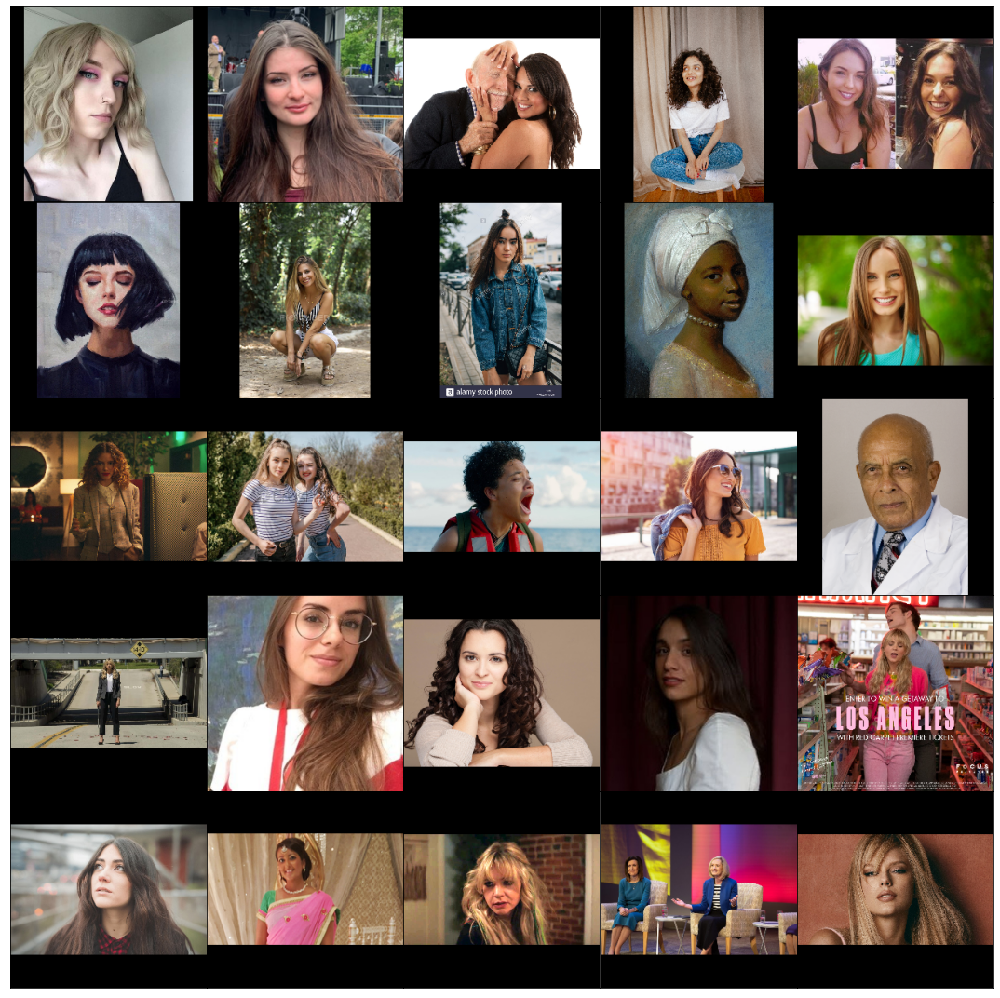

In [17]:
# Display the first 25 downloaded images
display_many(img_paths)

## Young women (black)

In [18]:
# Query term
query = "young woman black"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls_black.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

[INFO] downloaded: 25/199	google_scrape/young_woman_black_000024.jpg
[INFO] downloaded: 50/199	google_scrape/young_woman_black_000049.jpg
[INFO] downloaded: 75/199	google_scrape/young_woman_black_000074.jpg
[INFO] downloaded: 100/199	google_scrape/young_woman_black_000099.jpg
[INFO] downloaded: 125/199	google_scrape/young_woman_black_000124.jpg
[INFO] error downloading 145/199	google_scrape/young_woman_black_000143.jpg...skipping
[INFO] downloaded: 150/199	google_scrape/young_woman_black_000149.jpg
[INFO] downloaded: 175/199	google_scrape/young_woman_black_000174.jpg
Done.


In [20]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

189 images available.


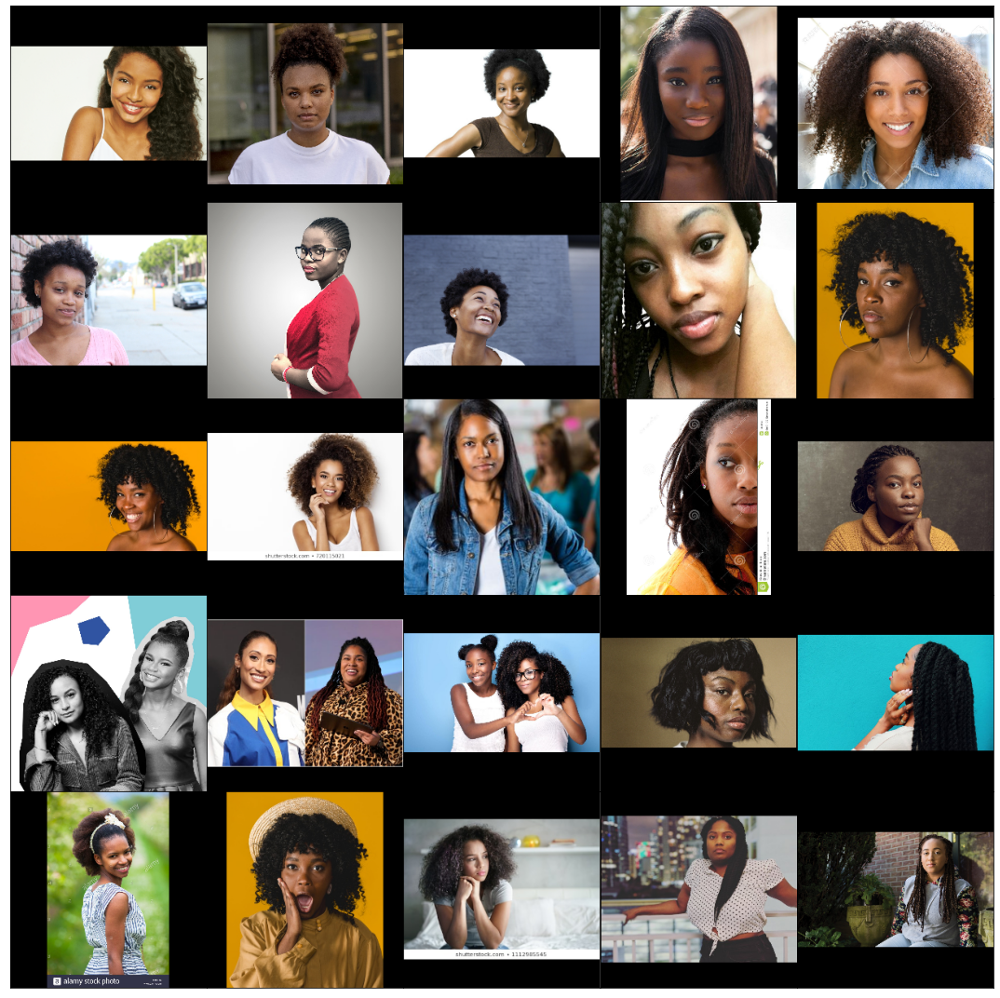

In [21]:
# Display the first 25 downloaded images
display_many(img_paths)

## Young women (hispanic)

In [22]:
# Query term
query = "young woman hispanic"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls_hispanic.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

[INFO] downloaded: 25/199	google_scrape/young_woman_hispanic_000024.jpg
[INFO] downloaded: 50/199	google_scrape/young_woman_hispanic_000049.jpg
[INFO] downloaded: 75/199	google_scrape/young_woman_hispanic_000074.jpg
[INFO] downloaded: 100/199	google_scrape/young_woman_hispanic_000099.jpg
[INFO] downloaded: 125/199	google_scrape/young_woman_hispanic_000124.jpg
[INFO] downloaded: 150/199	google_scrape/young_woman_hispanic_000149.jpg
[INFO] downloaded: 175/199	google_scrape/young_woman_hispanic_000174.jpg
Done.


In [23]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

197 images available.


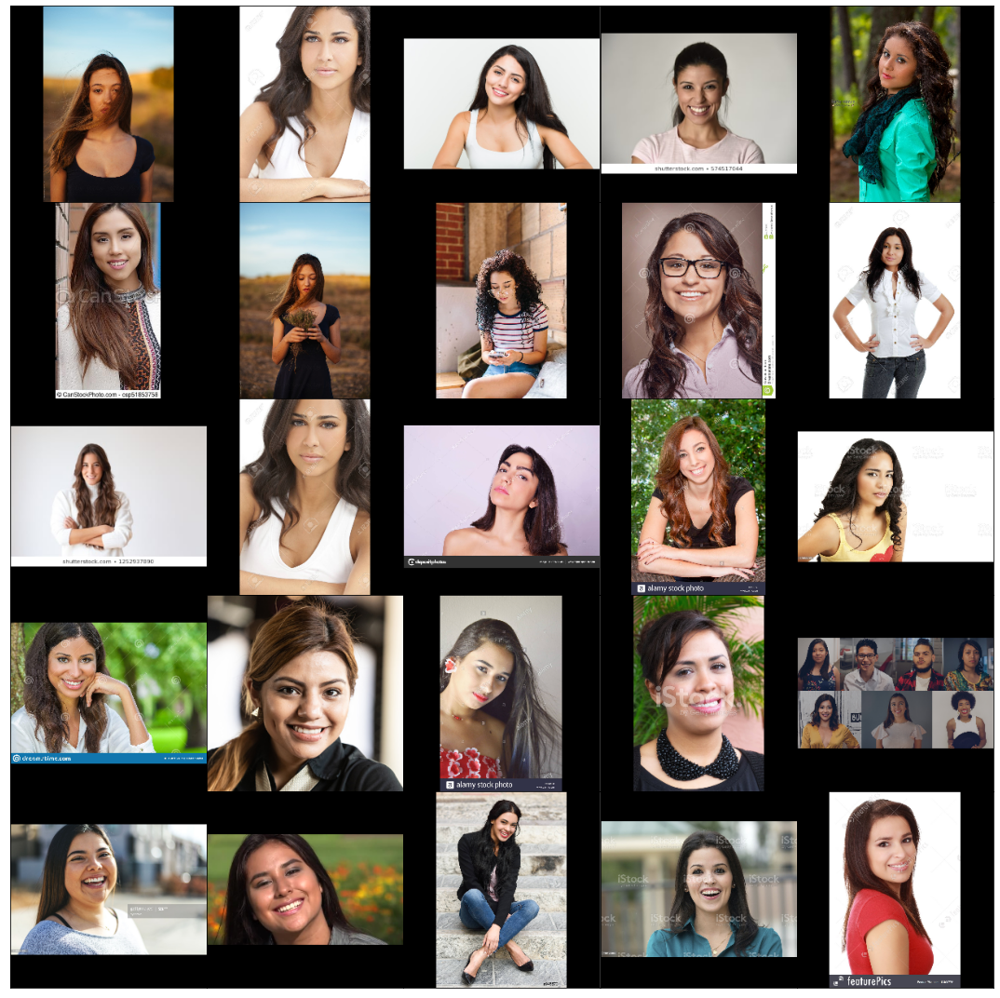

In [24]:
# Display the first 25 downloaded images
display_many(img_paths)

## Young women (asian)

In [25]:
# Query term
query = "young woman asian"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls_asian.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

[INFO] downloaded: 25/299	google_scrape/young_woman_asian_000024.jpg
[INFO] downloaded: 50/299	google_scrape/young_woman_asian_000049.jpg
[INFO] downloaded: 75/299	google_scrape/young_woman_asian_000074.jpg
[INFO] downloaded: 100/299	google_scrape/young_woman_asian_000099.jpg
[INFO] downloaded: 125/299	google_scrape/young_woman_asian_000124.jpg
[INFO] downloaded: 150/299	google_scrape/young_woman_asian_000149.jpg
[INFO] downloaded: 175/299	google_scrape/young_woman_asian_000174.jpg
[INFO] downloaded: 200/299	google_scrape/young_woman_asian_000199.jpg
[INFO] downloaded: 225/299	google_scrape/young_woman_asian_000224.jpg
[INFO] downloaded: 250/299	google_scrape/young_woman_asian_000249.jpg
[INFO] downloaded: 275/299	google_scrape/young_woman_asian_000274.jpg
Done.
Removing corrupt files...


In [26]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

299 images available.


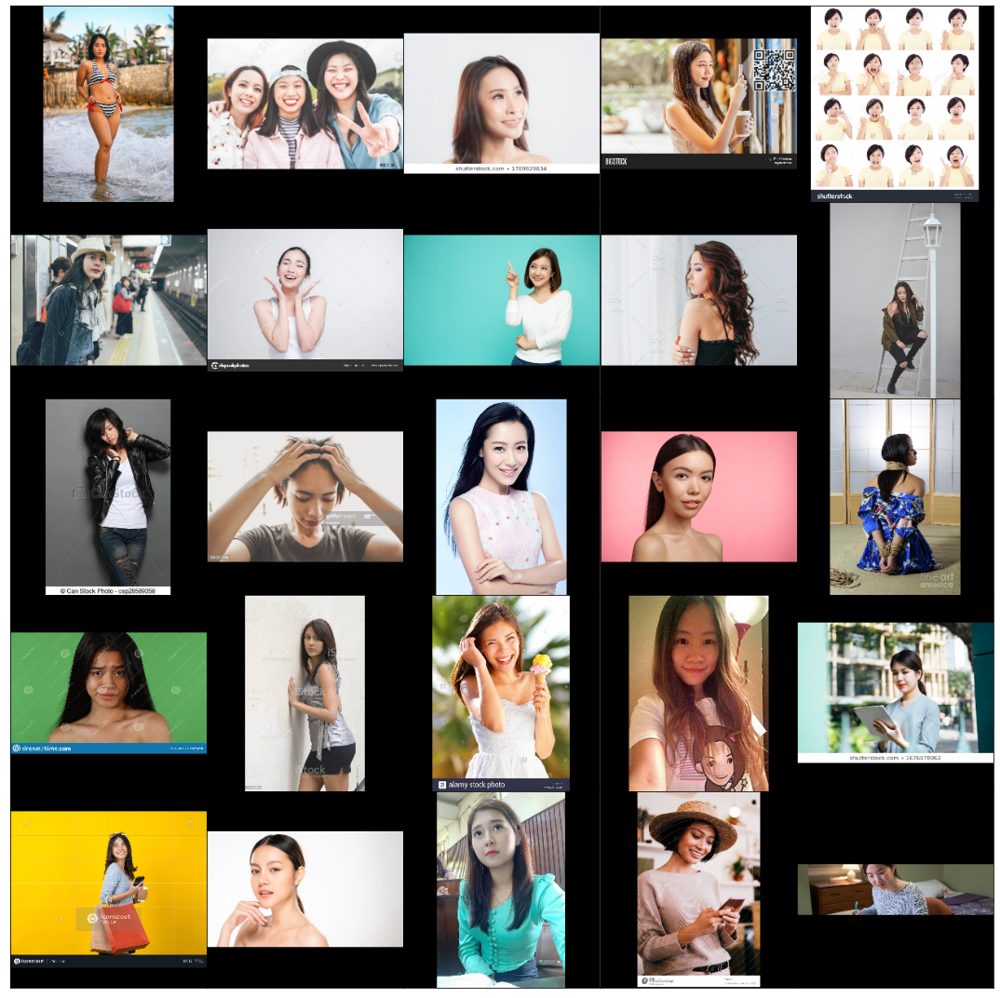

In [27]:
# Display the first 25 downloaded images
display_many(img_paths)

## Young women (Instagram)

In [28]:
# Query term
query = "young woman instagram"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls_instagram.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

[INFO] error downloading 24/746	google_scrape/young_woman_instagram_000023.jpg...skipping
[INFO] downloaded: 25/746	google_scrape/young_woman_instagram_000024.jpg
[INFO] error downloading 40/746	google_scrape/young_woman_instagram_000038.jpg...skipping
[INFO] downloaded: 50/746	google_scrape/young_woman_instagram_000049.jpg
[INFO] error downloading 57/746	google_scrape/young_woman_instagram_000056.jpg...skipping
[INFO] error downloading 65/746	google_scrape/young_woman_instagram_000064.jpg...skipping
[INFO] error downloading 70/746	google_scrape/young_woman_instagram_000069.jpg...skipping
[INFO] downloaded: 75/746	google_scrape/young_woman_instagram_000074.jpg
[INFO] error downloading 77/746	google_scrape/young_woman_instagram_000076.jpg...skipping
[INFO] error downloading 96/746	google_scrape/young_woman_instagram_000095.jpg...skipping
[INFO] downloaded: 100/746	google_scrape/young_woman_instagram_000099.jpg
[INFO] error downloading 102/746	google_scrape/young_woman_instagram_000101.j

In [29]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

707 images available.


In [30]:
# Display the first 25 downloaded images
display_many(img_paths)

Output hidden; open in https://colab.research.google.com to view.

## Young women (beautiful)

In [31]:
# Query term
query = "young woman beautiful"
query = '_'.join(query.split(' '))

In [ ]:
# Read the list of urls scraped from Google
urls = get_urls('google_scrape/urls/urls_beautiful.txt')

# Download images from list
download_images(urls, dir=scrape_dir, label=query)

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

# Remove corrupt images
print("Removing corrupt files...")
for i in range(len(img_paths)):
    try:
        img = load_image(img_paths[i])
    except:
        os.remove(img_paths[i])

[INFO] error downloading 7/899	google_scrape/young_woman_beautiful_000006.jpg...skipping
[INFO] error downloading 10/899	google_scrape/young_woman_beautiful_000008.jpg...skipping
[INFO] downloaded: 25/899	google_scrape/young_woman_beautiful_000024.jpg
[INFO] downloaded: 50/899	google_scrape/young_woman_beautiful_000049.jpg
[INFO] downloaded: 75/899	google_scrape/young_woman_beautiful_000074.jpg
[INFO] downloaded: 100/899	google_scrape/young_woman_beautiful_000099.jpg
[INFO] downloaded: 125/899	google_scrape/young_woman_beautiful_000124.jpg
[INFO] downloaded: 150/899	google_scrape/young_woman_beautiful_000149.jpg
[INFO] downloaded: 175/899	google_scrape/young_woman_beautiful_000174.jpg
[INFO] downloaded: 200/899	google_scrape/young_woman_beautiful_000199.jpg
[INFO] error downloading 214/899	google_scrape/young_woman_beautiful_000213.jpg...skipping
[INFO] downloaded: 225/899	google_scrape/young_woman_beautiful_000224.jpg
[INFO] downloaded: 250/899	google_scrape/young_woman_beautiful_0002

In [32]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))

print("{} images available.".format(len(img_paths)))

896 images available.


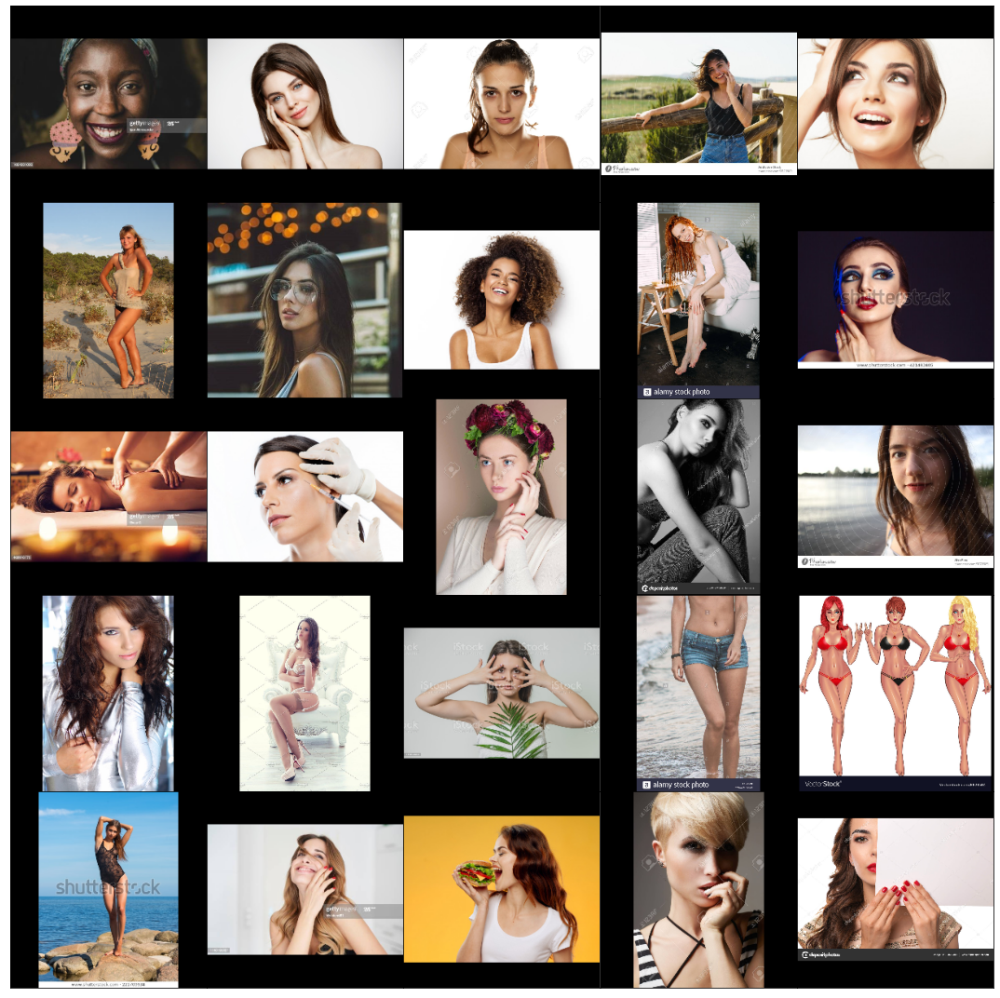

In [33]:
# Display the first 25 downloaded images
display_many(img_paths)

## Explore all images

In [34]:
# Load local paths to downloaded images
img_paths = glob.glob("{}/*.jpg".format(scrape_dir))

print("{} images available.".format(len(img_paths)))

2887 images available.


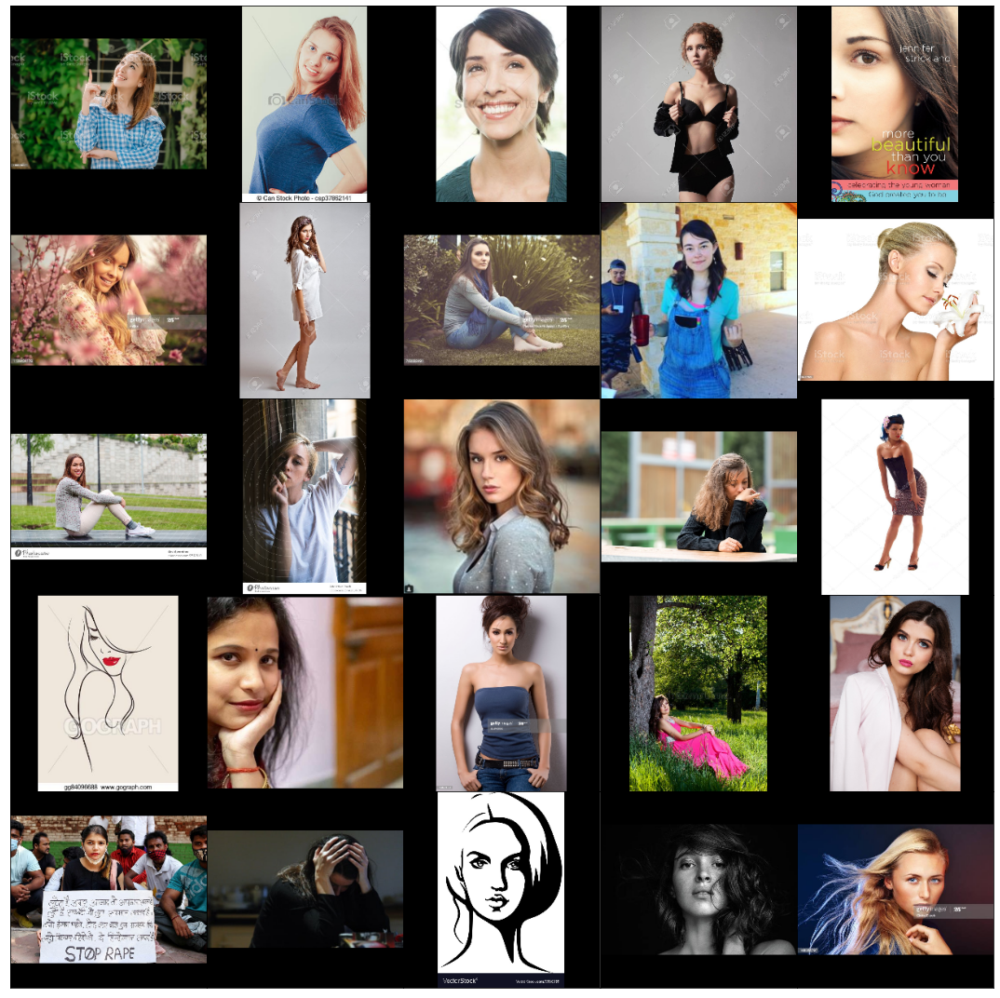

In [35]:
# Display the first 25 downloaded images
np.random.seed(0)
np.random.shuffle(img_paths)
display_many(img_paths)

## Dataset statistics

In [124]:
# Print balance of all downloaded images
files = glob.glob('{}/*.jpg'.format(scrape_dir))
print_search_term_balance(files)

young_woman_beautiful    : 896 photos (31.04%)
young_woman_instagram    : 707 photos (24.49%)
young_woman              : 599 photos (20.75%)
young_woman_asian        : 299 photos (10.36%)
young_woman_hispanic     : 197 photos (6.82%)
young_woman_black        : 189 photos (6.55%)
-----------------------------------------------
Total: 2887 images


## Download files to local

Move files of a specific search term into a temporary folder that can be downloaded from Google Drive.

In [67]:
# Define location of all downloaded images
scrape_dir = 'google_scrape/downloaded'

In [93]:
# Define tmp directory
tmp_dir = 'google_scrape/tmp'
!mkdir google_scrape/tmp

In [99]:
# Query term
query = "young woman beautiful"
query = '_'.join(query.split(' '))

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(scrape_dir, query))
print("Moving {:,} files...".format(len(img_paths)))

for path in img_paths:
    new_path = tmp_dir + path[len(scrape_dir):]
    shutil.move(path, new_path)
print("Done. All files have been moved to 'tmp/'")

Moving 896 files...
Done. All files have been moved to 'tmp/'


Now, go to Google Drive and download the tmp directory. When done, make sure to put all the images back to the main directory.

In [100]:
# Query term
query = "young woman beautiful"
query = '_'.join(query.split(' '))

# Load local paths to downloaded images
img_paths = glob.glob("{}/{}_[0-9]*.jpg".format(tmp_dir, query))
print("Moving {:,} files...".format(len(img_paths)))

for path in img_paths:
    new_path = scrape_dir + path[len(tmp_dir):]
    shutil.move(path, new_path)

print("Done. All files have been removed from 'tmp/'")

Moving 896 files...
Done. All files have been removed from 'tmp/'


# Extract face from image

Code based off of tutorial found at [Machine Learning Mastery](https://machinelearningmastery.com/how-to-perform-face-recognition-with-vggface2-convolutional-neural-network-in-keras/).

In [204]:
cd ..

/content/drive/My Drive/Cafe


In [205]:
friends = glob.glob('friends/felicia*.jpg')
print("{} images found.".format(len(friends)))
print(friends)

5 images found.
['friends/felicia5.jpg', 'friends/felicia4.jpg', 'friends/felicia3.jpg', 'friends/felicia2.jpg', 'friends/felicia1.jpg']


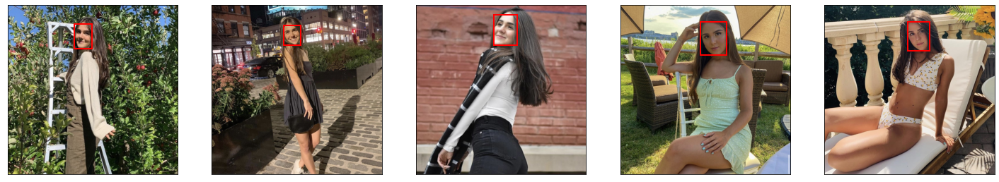

In [206]:
# Load friend images
friend_imgs = [load_image(f) for f in friends]

# Extract friend faces
faces = [get_face(img) for img in friend_imgs]
friend_faces = [f[0] for f in faces]
face_patches = [f[1] for f in faces]

# Plot images with face patches
plot_multiple_with_box(friend_imgs, face_patches);

In [139]:
# Save face to `face_only` directory for future use
face_only_paths = ['friends/face_only/' + f.split('/')[-1] for f in friends]

for i in range(len(friends)):
    img = friend_faces[i]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(face_only_paths[i], img)

# Prepare training images

Once all downloaded images have been labeled as `sip` or `skip` (and those with watermarks are removed), we are ready to prepare the training images.

## Crop faces for a folder

The are labeled as `sip` or `skip` outside of this notebook (and Google Drive). Once labeled, they are uploaded to Google Drive in the `uploaded/sip` and `uploaded/skip` subdirectories. We need to crop each of these to a 256x256 window around the face of the person. This will ensure that our model learns the features of each person's face, not the enviornment or any other features of the body.

In [34]:
cd google_scrape/uploaded

/content/drive/My Drive/Cafe/google_scrape/uploaded


In [20]:
# Get all image paths
sip_files = glob.glob('uploaded/sip/*.jpg')
skip_files = glob.glob('uploaded/skip/*.jpg')
files = sip_files + skip_files

# Loop over all images and overwrite them with the extracted face
print('Extracting faces from {} files'.format(len(files)))
for i in range(len(files)):
    if not (i+1)%10: print("\tLoading image {}/{}...".format(i+1, len(files)))
    img = load_image(files[i])
    face = get_face(img)[0]
    face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
    cv2.imwrite(files[i], face)

In [37]:
cd ../..

/content/drive/My Drive/Cafe


## Create folder architecture 

Now it is time to construct the folder architecture. To feed in data to VGG16 in `keras`, we will use `DataGenerators`. These objects expect the following directory structure to properly load in the training/test data:

```
data/
    train/
        sip/
            img0.jpg
            img1.jpg
            ...
        skip/
            img0.jpg
            img1.jpg
            ...
    test/
        sip/
            img0.jpg
            img1.jpg
            ...
        skip/
            img0.jpg
            img1.jpg
            ...
```

In [39]:
cd google_scrape/

/content/drive/My Drive/Cafe/google_scrape


In [ ]:
!mkdir data
!mkdir data/train
!mkdir data/train/sip
!mkdir data/train/skip
!mkdir data/test
!mkdir data/test/sip
!mkdir data/test/skip

**Balance the dataset**

It is also important to ensure a balanced mix of `sip` and `skip` images so that bias is minimized in the predictions. We will only take an equal number of images from each class.

In [46]:
# Load all image paths from available images
sip_paths = glob.glob('uploaded/sip/*.jpg')
skip_paths = glob.glob('uploaded/skip/*.jpg')

In [47]:
# Find the balance of between the two classes in the uploaded data
counts, perc = print_sip_skip_balance(sip_paths, skip_paths)

This dataset contains 0 sip images (0.0%)
This dataset contains 147 skip images (100.0%)


**Note:** After runnning the following cells, one of the two classes should be empty (since we are actually moving the images to a different directory). That thee above output shows 0 sip images and 147 skip images implies that there were 147 more skip images. These are left over after moving an equal number of images into the appropriate subdirectory.

In [ ]:
# Get the count of the smaller class
min_num = counts.min()

# Randomly select that number of images from each class
idx = np.arange(min_num)
np.random.shuffle(idx)  

sip_paths_bal = np.array(sip_paths)[idx]
skip_paths_bal = np.array(skip_paths)[idx]

# Find the new balance of the selected data
print_sip_skip_balance(sip_paths_bal, skip_paths_bal);

This dataset contains 520 sip images (50.0%)
This dataset contains 520 skip images (50.0%)


**Create training and test set**

In [ ]:
# Split the selected data into a training and test set
sip_train, sip_test = train_test_split(sip_paths_bal, test_size=0.2, random_state=889)
skip_train, skip_test = train_test_split(skip_paths_bal, test_size=0.2, random_state=889)

**Move files into the appropriate subdirectory.**

In [ ]:
print("Creating training set architecture...")
for path in sip_train:
    shutil.move(path, "data/train/" + path)
for path in skip_train:
    shutil.move(path, "data/train/" + path)

print("Creating test set architecture...")
for path in sip_test:
    shutil.move(path, "data/test/" + path)
for path in skip_test:
    shutil.move(path, "data/test/" + path)

print("Done.")

Creating training set architecture...
Creating test set architecture...
Done.


## Dataset statistics

Let's look at the new breakdown of each search term in our final dataset.

**All images**

In [48]:
# Print balance of kept images(after removing those with a watermark)
files = glob.glob('data/*/*/*.jpg')
print_search_term_balance(files)

young_woman_beautiful    : 345 photos (33.17%)
young_woman_instagram    : 261 photos (25.10%)
young_woman              : 194 photos (18.65%)
young_woman_black        : 103 photos (9.90%)
young_woman_asian        : 73 photos (7.02%)
young_woman_hispanic     : 64 photos (6.15%)
-----------------------------------------------
Total: 1040 images


Of the 1040 images, 240 (23.07%) are exclusively of minority women. This value is actually higher, as the search terms `young_woman\beautiful\instagram` can contain minorities as well. Generally though, those groups were of mostly white women.

**Sip images**

In [128]:
# Print balance of kept sip images(after removing those with a watermark)
files = glob.glob('data/*/sip/*.jpg')
print_search_term_balance(files)

young_woman_beautiful    : 244 photos (46.92%)
young_woman_instagram    : 119 photos (22.88%)
young_woman              : 108 photos (20.77%)
young_woman_hispanic     : 22 photos (4.23%)
young_woman_black        : 15 photos (2.88%)
young_woman_asian        : 12 photos (2.31%)
-----------------------------------------------
Total: 520 images


Of the 520 `sip` images, 49 (9.42%) are exclusively of minority women. As before, this number may be slightly higher. However, this is significantly less than the total proportion of minority images in the dataset. This is important to note, as this user appears to have a preferance towards white women.

**Skip images**

In [129]:
# Print balance of kept skip images(after removing those with a watermark)
files = glob.glob('data/*/skip/*.jpg')
print_search_term_balance(files)

young_woman_instagram    : 142 photos (27.31%)
young_woman_beautiful    : 101 photos (19.42%)
young_woman_black        : 88 photos (16.92%)
young_woman              : 86 photos (16.54%)
young_woman_asian        : 61 photos (11.73%)
young_woman_hispanic     : 42 photos (8.08%)
-----------------------------------------------
Total: 520 images


Of the 520 `skip` images, 191 (36.73%) are exclusively of minority women. As before, this number may be slightly higher. The proportion of minority women is nearly 4 times greater in the `skip` class compared to the `sip` class. It is important to check that models do not learn too much bias and label all images of a certain ethnicity as `skip`. This will be revisted after creating the model.

## Explore Kept Images

In [17]:
# Load local paths to downloaded images
img_paths = glob.glob("data/*/*/*.jpg")

print("{} images available.".format(len(img_paths)))

1040 images available.


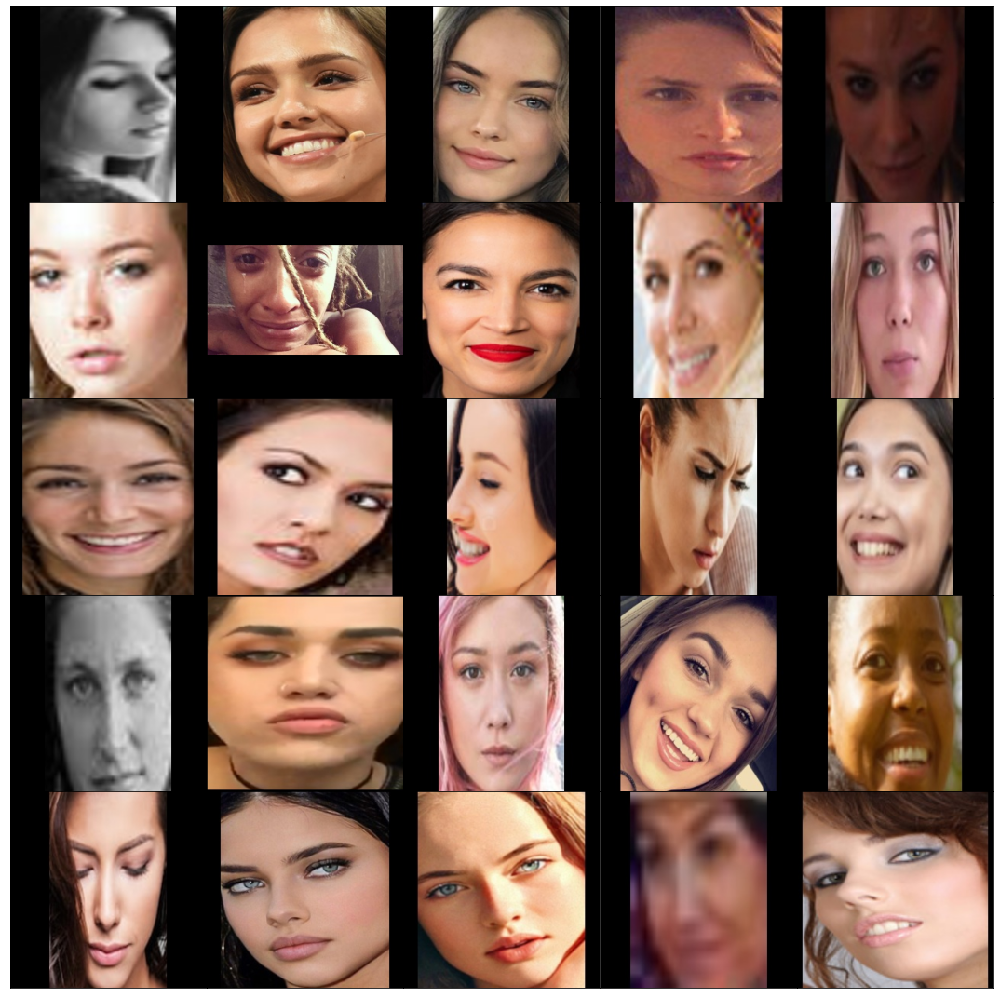

In [19]:
# Display the first 25 downloaded images
np.random.shuffle(img_paths)
display_many(img_paths)

In [49]:
cd ..

/content/drive/My Drive/Cafe


# Create Model

Transfer learning is a very useful technique that allows us to train a powerful deep learning model without requiring a large amount of training/validation images. VGG16 is a very powerful and commonly used Convolutional Neural Network proposed by [Karen Simonyan and Andrew Zisserman](https://arxiv.org/abs/1409.1556). The model architecture was trained on the `ImageNet` dataset (which contains over 14 million images of 1,000 objects) and acheived a top-5 accuracy of 92.7%. 

However, we don't need to classify 1,000 objects We only want to distinguish between `sip` and `skip`. We can utilize the VGG16 model by chopping off the last 3 (dense) layers. The convolutional layers that we keep are already trained to detect features within an image. This will save us a lot of time (and required training images), as we do not need to start from scratch. The *bottleneck features* at the end of VGG16 can then be fed into fresh set of dense layers in a structure we specify.

![img](https://drive.google.com/uc?export=view&id=1SOaHoti6FyW5Qx6vryMKxGnp5O8uEcJb)
> *Strip the fully connected layers from the VGG16 pretrained model. ([AppliedMachineLearning.blog](https://appliedmachinelearning.blog/2019/07/29/transfer-learning-using-feature-extraction-from-trained-models-food-images-classification/))*

![img](https://drive.google.com/uc?export=view&id=19bb3RdK16e_01-5acyY2Vm1snsdPcFuh)
> *Append new, trainable dense layers to the end of the model.*


The code to create the final models were based on the following tutorials:
  * *Face Recognition Using Transfer Learning*, [Medium](https://medium.com/@p.rajeshbabu6666/face-recognition-using-transfer-learning-64de34de68a6)
  * *Fine-tuning with Keras and Deep Learning*, [PyImageSearch](https://www.pyimagesearch.com/2019/06/03/fine-tuning-with-keras-and-deep-learning/)

In [50]:
cd google_scrape

/content/drive/My Drive/Cafe/google_scrape


In [51]:
!mkdir models

mkdir: cannot create directory ‘models’: File exists


In [ ]:
model_dir = "google5"
if not os.path.exists(model_dir):
    os.mkdir(model_dir)
if not os.path.exists(model_dir + "/initialized"):
    os.mkdir(model_dir + "/initialized")
if not os.path.exists(model_dir + "/tuned"):
    os.mkdir(model_dir + "/tuned")

## Load Data Generators

[Kandel and Castelli](https://www.sciencedirect.com/science/article/pii/S2405959519303455) found that when VGG16 was trained with smaller batch sizes, it had a better performance on the ImageNet dataset. For this reason, we will choose our batch size to be 32.

**Note:** Previously, the testing data was refered to as *test*. In the following sections, the term *validation* refers to the same set of images (testing data).

In [ ]:
# https://www.sciencedirect.com/science/article/pii/S2405959519303455
batch_size = 32
preprocess = True

# derive the paths to the training and validation directories
train_path = "data/train"
validation_path = "data/test"

# Load training and validation generators
train_generator, validation_generator = load_generators(train_path, validation_path, batch_size=batch_size, preprocess=preprocess)

# Determine the total number of image paths in the train and validation directories
n_train = train_generator.samples
n_validation = validation_generator.samples

print("\nThere are {:,} training samples and {:,} validation samples.".format(n_train, n_validation))

Found 832 images belonging to 2 classes.
Found 208 images belonging to 2 classes.

There are 832 training samples and 208 validation samples.


## Combine VGG and Fresh Layers

In [ ]:
# Load the pre-trained VGG16 model without the dense layers 
vgg16 = VGG16(weights="imagenet", 
                  include_top=False,
                  input_tensor=Input(shape=(256, 256, 3)))

# Build the "fresh", trainable layers to append onto the end of the VGG16 model
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(256, activation="relu", 
                    kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-5),
                    bias_regularizer=regularizers.l2(1e-5),
                    activity_regularizer=regularizers.l2(1e-5)
					)(fresh_model)
fresh_model = Dropout(0.3)(fresh_model)
fresh_model = Dense(256, activation="relu",  
                    kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-5),
                    bias_regularizer=regularizers.l2(1e-5),
                    activity_regularizer=regularizers.l2(1e-5)
					)(fresh_model)
fresh_model = Dropout(0.3)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)

# Append the fresh, trainable layers to the VGG16 model
model = Model(inputs=vgg16.input, outputs=fresh_model)

# Freeze the weights on the VGG16 layers so that they are not updated during the first round of training
for layer in vgg16.layers:
	layer.trainable = False

# Compile the full model
print("Compiling model...")
opt = SGD(lr=1e-4, momentum=0.9)
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20, restore_best_weights=True)

# Print out a summary of the model
print(model.summary())

58892288/58889256 [==============================] - 1s 0us/step
[INFO] compiling model...
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_____________________________

## Initialize fresh layers

Model training is split into two parts. The first part is intializing the new layers. Here, we will train for a small number of epochs to generate *learned* values for the weights as opposed to completely random values.

In [ ]:
print("Training fresh layers...")
H = model.fit(
	train_generator,
	steps_per_epoch = n_train // batch_size,
	validation_data = validation_generator,
	validation_steps = n_validation // batch_size,
	epochs=30,
    # callbacks=[es]
    )

# Save initialized model and history
model.save(model_dir + "/initialized")
json.dump(H.history, open(model_dir + "/initialized/history.json", 'w'))
print("Saved at {}/initialized".format(model_dir))

[INFO] training head...
Epoch 1/30
26/26 [==============================] - 465s 18s/step - loss: 3.7731 - accuracy: 0.5144 - val_loss: 2.0648 - val_accuracy: 0.5260
Epoch 2/30
26/26 [==============================] - 15s 574ms/step - loss: 2.7699 - accuracy: 0.5264 - val_loss: 1.6269 - val_accuracy: 0.5208
Epoch 3/30
26/26 [==============================] - 15s 573ms/step - loss: 2.1397 - accuracy: 0.5505 - val_loss: 1.4261 - val_accuracy: 0.4896
Epoch 4/30
26/26 [==============================] - 15s 573ms/step - loss: 1.7771 - accuracy: 0.5120 - val_loss: 1.3859 - val_accuracy: 0.4531
Epoch 5/30
26/26 [==============================] - 15s 571ms/step - loss: 1.5707 - accuracy: 0.5144 - val_loss: 1.3519 - val_accuracy: 0.5052
Epoch 6/30
26/26 [==============================] - 15s 574ms/step - loss: 1.4288 - accuracy: 0.5180 - val_loss: 1.3128 - val_accuracy: 0.5000
Epoch 7/30
26/26 [==============================] - 15s 574ms/step - loss: 1.3728 - accuracy: 0.5553 - val_loss: 1.3064

[INFO] evaluating after fine-tuning network head...
              precision    recall  f1-score   support

         sip       0.60      0.61      0.60       104
        skip       0.60      0.60      0.60       104

    accuracy                           0.60       208
   macro avg       0.60      0.60      0.60       208
weighted avg       0.60      0.60      0.60       208

           Pred sip  Pred skip
True sip         63         41
True skip        42         62


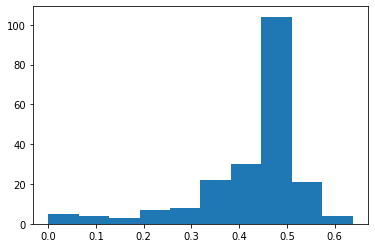

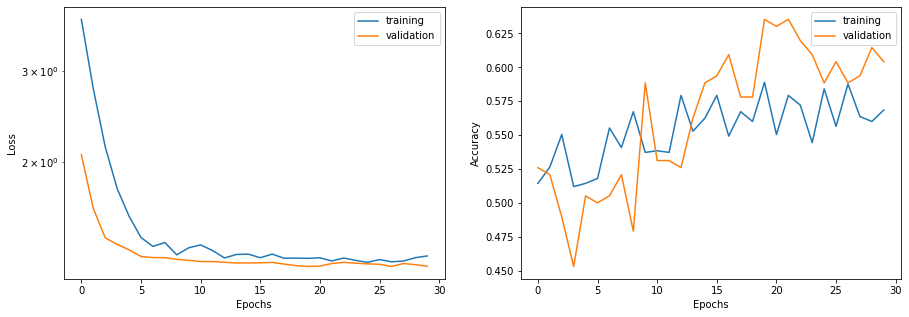

In [ ]:
# Load model
model = keras.models.load_model(model_dir + "/initialized", compile=True)
H = json.load(open(model_dir + "/initialized/history.json", 'rb'))

# Reset the validation generator and evaluate the model after initialization
print("[INFO] evaluating after fine-tuning network head...")
validation_generator.reset()

# Make predictions
output = model.predict(validation_generator, steps=10)
y_score, y_pred, y_labels = process_results(output, 0.5)

# Classification report
print(classification_report(
    validation_generator.classes,   # y_true
    y_pred,                       # y_pred
	target_names=validation_generator.class_indices.keys()), '\n\n')

# Confusion matrix
cm = confusion_matrix(validation_generator.classes, y_pred)
cm = pd.DataFrame(cm, columns=["Pred sip", "Pred skip"], index=["True sip", "True skip"])
print(cm, '\n\n')

# Histogram
plt.hist(y_score.flatten())
plt.show();

fig = plot_results(H)
fig.savefig(model_dir + "/initialized/results.jpg")

## Fine-tune full model

In the second part of the training process, the last set of convolutional layers are unfrozen and the model is trained for a longer time. We will use *early stopping* to define the stopping criteria for training.

In [ ]:
# Reset both data generators
train_generator.reset()
validation_generator.reset()

# Unfreeze the last set of convolutional layers
for layer in vgg16.layers[15:]:
	layer.trainable = True

# for the changes to the model to take affect we need to recompile
# the model, this time using SGD with a *very* small learning rate
print("[INFO] re-compiling model...")
opt = SGD(lr=1e-4, momentum=0.9)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

# Add early-stopping criteria to avoid over-fitting
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50, restore_best_weights=True)

# Train the model
H = model.fit(
	train_generator,
	steps_per_epoch = n_train // batch_size,
	validation_data = validation_generator,
	validation_steps = n_validation // batch_size,
	epochs=300,
    callbacks=[es])

# Save the tuned model and history
model.save(model_dir + "/tuned")
json.dump(H.history, open(model_dir + "/tuned/history.json", 'w'))
print("Saved at {}/tuned".format(model_dir))

[INFO] re-compiling model...
Epoch 1/300
26/26 [==============================] - 19s 734ms/step - loss: 0.9450 - accuracy: 0.5901 - val_loss: 0.8963 - val_accuracy: 0.6875
Epoch 2/300
26/26 [==============================] - 19s 720ms/step - loss: 0.9551 - accuracy: 0.5974 - val_loss: 0.8814 - val_accuracy: 0.7344
Epoch 3/300
26/26 [==============================] - 19s 715ms/step - loss: 0.9557 - accuracy: 0.5781 - val_loss: 0.8957 - val_accuracy: 0.7135
Epoch 4/300
26/26 [==============================] - 19s 712ms/step - loss: 0.9368 - accuracy: 0.6082 - val_loss: 0.8959 - val_accuracy: 0.7135
Epoch 5/300
26/26 [==============================] - 19s 712ms/step - loss: 0.9493 - accuracy: 0.6022 - val_loss: 0.8852 - val_accuracy: 0.6562
Epoch 6/300
26/26 [==============================] - 19s 714ms/step - loss: 0.9209 - accuracy: 0.6298 - val_loss: 0.8639 - val_accuracy: 0.6771
Epoch 7/300
26/26 [==============================] - 18s 709ms/step - loss: 0.9161 - accuracy: 0.6382 - val

[INFO] evaluating after fine-tuning network...
              precision    recall  f1-score   support

         sip       0.72      0.86      0.78       104
        skip       0.82      0.67      0.74       104

    accuracy                           0.76       208
   macro avg       0.77      0.76      0.76       208
weighted avg       0.77      0.76      0.76       208

           Pred sip  Pred skip
True sip         89         15
True skip        34         70


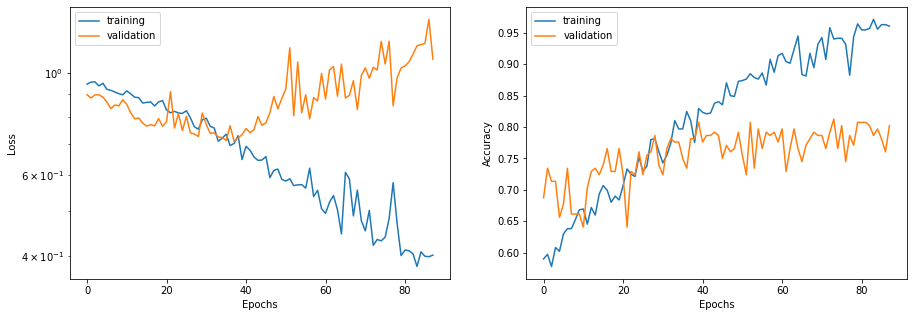

In [ ]:
# Load model
model = keras.models.load_model(model_dir + "/tuned", compile=True)
H = json.load(open(model_dir + "/tuned/history.json", 'rb'))

# reset the testing generator and then use our trained model to
# make predictions on the data
print("[INFO] evaluating after fine-tuning network...")
validation_generator.reset()
predIdxs = model.predict(
    validation_generator,
	steps=(n_validation // batch_size) + 1)

predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(
    validation_generator.classes,   # y_true
    predIdxs,                       # y_pred
	target_names=validation_generator.class_indices.keys()))

cm = confusion_matrix(validation_generator.classes, predIdxs)
cm = pd.DataFrame(cm, columns=["Pred sip", "Pred skip"], index=["True sip", "True skip"])
print(cm)

fig = plot_results(H)
fig.savefig(model_dir + "/tuned/results.jpg")

# Results

## `google1`
Flatten, Dense(128, `ReLu`), Dropout(0.5), Dense(2, `softmax`)

No preprocessing

**Parameters**

* `batch_size` = 30
* `preprocess` = False
* Flatten, Dense(128, `ReLu`), Dropout(0.5), Dense(2, `softmax`)
```
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(128, activation="relu")(fresh_model)
fresh_model = Dropout(0.5)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)
```
* Trainable params: 4,194,690
* `Loss = "categorical_crossentropy"`
* 832 training images, 208 validation images (both balanced)

**Results**

* Initialized with 50 epochs (`early-stopping ['val_loss']` never occurred)
    * `loss: 0.6339 - accuracy: 0.6135 - val_loss: 0.6466 - val_accuracy: 0.5667`

* Tuned with 100 epochs (`early-stopping ['val_loss']` at 62, `patience` = 20)
    * `loss: 0.2758 - accuracy: 0.8903 - val_loss: 0.6345 - val_accuracy: 0.7778`

* Best `sip` threshold: 0.28
* Notes:
  * Turn off preprocessing for test images
  * Validation on friends dataset looked pretty good (subjectively)!
  * Same when examining results on validation set
  * When tuning, early-stopping stopped the training process because the validation loss was not decreasing, but the accuracies were still climbing and the training loss was still rapidly declining. 

|    |precision|recall|f1-score|
|----|---------|------|--------|
|**Initialization**|  |       ||
|sip |  0.56   | 0.58 |  0.57  |
|skip|  0.56   | 0.55 |  0.56  |
|**Fine-tuned**|      |       ||
|sip |  0.69   | 0.90 |  0.78  |
|skip|  0.86   | 0.59 |  0.70  |

|              |Pred Sip|Pred Skip|
|--------------|--------|---------|
|**Initialization**|    |         |
|     True Sip |   60   |    44   |
|     True Skip|   47   |    57   |
|**Fine-tuned**|        |         |
|     True Sip |   94   |    10   |
|     True Skip|   43   |    61   |
|**Thresh = 0.28**|     |         |
|     True Sip |   97   |    7    |
|     True Skip|   59   |    45   |


![img](https://drive.google.com/uc?export=view&id=1003GEAoV6BHYDV8b7Vl6FVO9KxQmRnZA)
> *Fine-tuning results. Loss vs. Epochs (left) and Accuracy vs. Epoch (right)*


## `google2`
Flatten, Dense(128, `ReLu`), Dropout(0.5), Dense(2, `softmax`)

Preprocessing

**Parameters**

* `batch_size` = 32
* `preprocess` = True
* Flatten, Dense(128, `ReLu`), Dropout(0.5), Dense(2, `softmax`)
```
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(128, activation="relu")(fresh_model)
fresh_model = Dropout(0.5)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)
```
* Trainable params: 4,194,690
* `Loss = "categorical_crossentropy"`
* 832 training images, 208 validation images (both balanced)

**Results**

* Initialized with 50 epochs (`early-stopping ['val_loss']` never occurred)
    * `loss: 0.6017 - accuracy: 0.6466 - val_loss: 0.5453 - val_accuracy: 0.7083`
* Tuned with 300 epochs (`early-stopping ['val_loss']` at 44, `patience` = 20)
    * `loss: 0.3587 - accuracy: 0.8462 - val_loss: 0.5394 - val_accuracy: 0.7969`
* Best `sip` threshold: 0.44
* Notes:
  * Turn on preprocessing for test images
  * Results on friends dataset was comparable to the `google1`. Not noticeably better.
  * Same when examining results on validation set
  * When tuning, early-stopping stopped the training process because the validation loss was not decreasing, but the accuracies were still climbing and the training loss was still rapidly declining. 


|    |precision|recall|f1-score|
|----|---------|------|--------|
|**Initialization**|  |       ||
|sip |  0.71   | 0.66 |  0.69  |
|skip|  0.68   | 0.73 |  0.71  |
|**Fine-tuned**|      |       ||
|sip |  0.72   | 0.84 |  0.78  |
|skip|  0.81   | 0.68 |  0.74  |

|              |Pred Sip|Pred Skip|
|--------------|--------|---------|
|**Initialization**|    |         |
|     True Sip |   69   |    35   |
|     True Skip|   28   |    76   |
|**Fine-tuned**|        |         |
|     True Sip |   87   |    17   |
|     True Skip|   33   |    71   |
|**Thresh = 0.44**|     |         |
|     True Sip |   91   |    13   |
|     True Skip|   37   |    67   |

![img](https://drive.google.com/uc?export=view&id=10YeGT4L-N3WvGj7uKaKhBTVpJBW_1Hct)
> *Fine-tuning results. Loss vs. Epochs (left) and Accuracy vs. Epoch (right)*

## `google3`
Flatten, Dense(128, `ReLu`), Dropout(0.3), Dense(128, `ReLu`), Dropout(0.3), Dense(128, `ReLu`), Dropout(0.3), Dense(2, `softmax`)

**Parameters**

* `batch_size` = 32
* `preprocess` = True
* Flatten, Dense(128, `ReLu`), Dropout(0.3), Dense(128, `ReLu`), Dropout(0.3), Dense(128, `ReLu`), Dropout(0.3), Dense(2, `softmax`)
```
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(128, activation="relu")(fresh_model)
fresh_model = Dropout(0.3)(fresh_model)
fresh_model = Dense(128, activation="relu")(fresh_model)
fresh_model = Dropout(0.3)(fresh_model)
fresh_model = Dense(128, activation="relu")(fresh_model)
fresh_model = Dropout(0.3)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)
```
* Trainable params: 4,227,714
* `Loss = "categorical_crossentropy"`
* 832 training images, 208 validation images (both balanced)

**Results**

* Initialized with 50 epochs (`early-stopping ['val_loss']` at 24, `patience` = 20 occurred)
    * `loss: 0.6949 - accuracy: 0.5421 - val_loss: 0.6775 - val_accuracy: 0.6146`
* Tuned with 300 epochs (`early-stopping ['val_loss']` at 151, `patience` = 50)
    * `loss: 0.4062 - accuracy: 0.8546 - val_loss: 0.7493 - val_accuracy: 0.7917`
* Best `sip` threshold: 0.45
* Notes:
  * Turn on preprocessing for test images
  * Results were not good. For some reason, the model never made any predictions above 0.5757514 for `sip`. Similar issues arose with different `patience` parameters. Though the final numbers look decent, this model must be thrown out.


|    |precision|recall|f1-score|
|----|---------|------|--------|
|**Initialization**|  |       ||
|sip |  0.57   | 0.77 |  0.65  |
|skip|  0.64   | 0.41 |  0.50  |
|**Fine-tuned**|      |       ||
|sip |  0.72   | 0.90 |  0.80  |
|skip|  0.87   | 0.65 |  0.75  |

|              |Pred Sip|Pred Skip|
|--------------|--------|---------|
|**Initialization**|    |        ||
|     True Sip |   80   |    24   |
|     True Skip|   61   |    43   |
|**Fine-tuned**|        |         |
|     True Sip |   94   |    10   |
|     True Skip|   36   |    68   |
|**Thresh = 0.45**|     |         |
|     True Sip |   95   |    9   |
|     True Skip|   45   |    59   |

![img](https://drive.google.com/uc?export=view&id=12G08bTN6nt-op9osyCGwrNroEWTOd1em)
> *Fine-tuning results. Loss vs. Epochs (left) and Accuracy vs. Epoch (right)*

## `google4`
Flatten, Dense(256, `ReLu`), Dropout(0.5), Dense(256, `ReLu`), Dropout(0.5), Dense(2, `softmax`)

**Parameters**

* `batch_size` = 32
* `preprocess` = True
* Flatten, Dense(256, `ReLu`), Dropout(0.5), Dense(256, `ReLu`), Dropout(0.5), Dense(2, `softmax`)
```
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(256, activation="relu")(fresh_model)
fresh_model = Dropout(0.5)(fresh_model)
fresh_model = Dense(256, activation="relu")(fresh_model)
fresh_model = Dropout(0.5)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)
```
* Trainable params: 8,455,170
* `Loss = "categorical_crossentropy"`
* 832 training images, 208 validation images (both balanced)

**Results**

* Initialized with 50 epochs (`early-stopping ['val_loss']` at 24, `patience` = 20 occurred)
    * `loss: 0.7139 - accuracy: 0.5505 - val_loss: 0.6529 - val_accuracy: 0.6719`
* Tuned with 300 epochs (`early-stopping ['val_loss']` at 140, `patience` = 20)
    * `loss: 0.2645 - accuracy: 0.8930 - val_loss: 0.6279 - val_accuracy: 0.7708`
* Best `sip` threshold: 0.29
* Notes:
  * Turn on preprocessing for test images
  * Results are very **sensitive**.
    * The distribution of predictions has a very heavy tail at the `skip` end.
    * This would suggest that the model has overfit the `skip` images
    * The final accuracy is pretty good, and many of the images predicted with very low scores are quite obviously `skip`. 
    * However, there are a number of `sip` images that were given a very low score, which is concerning. 
  


|    |precision|recall|f1-score|
|----|---------|------|--------|
|**Initialization**|  |       ||
|sip |  0.61   | 0.90 |  0.73  |
|skip|  0.81   | 0.42 |  0.56  |
|**Fine-tuned**|      |       ||
|sip |  0.74   | 0.89 |  0.81  |
|skip|  0.87   | 0.69 |  0.77  |

|              |Pred Sip|Pred Skip|
|--------------|--------|---------|
|**Initialization**|    |         |
|     True Sip |   94   |    10   |
|     True Skip|   60   |    44   |
|**Fine-tuned**|        |         |
|     True Sip |   93   |    11   |
|     True Skip|   32   |    72   |
|**Thresh = 0.29**|     |         |
|     True Sip |   99   |    5    |
|     True Skip|   49   |    55   |

![img](https://drive.google.com/uc?export=view&id=1-fSE0qZ5r2FeXt8p0Qk1JD11gNsv7q0w)
> *Fine-tuning results. Loss vs. Epochs (left) and Accuracy vs. Epoch (right)*

## `google5`
Flatten, Dense(128, `ReLu`, regularized), Dropout(0.5), Dense(2, `softmax`)

**Parameters**

* `batch_size` = 32
* `preprocess` = True
* Flatten, Dense(128, `ReLu`, regularized), Dropout(0.5), Dense(2, `softmax`)
```
fresh_model = vgg16.output
fresh_model = Flatten(name="flatten")(fresh_model)
fresh_model = Dense(128, activation="relu", 
                    kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-5),
                    bias_regularizer=regularizers.l2(1e-5),
                    activity_regularizer=regularizers.l2(1e-5)
					)(fresh_model)
fresh_model = Dropout(0.5)(fresh_model)
fresh_model = Dense(2, activation="softmax")(fresh_model)
```
* Trainable params: 4,194,690
* `Loss = "categorical_crossentropy"`
* 832 training images, 208 validation images (both balanced)

**Results**

* Initialized with 30 epochs (no callbacks)
    * `loss: 0.9334 - accuracy: 0.5841 - val_loss: 0.9080 - val_accuracy: 0.6667`
* Tuned with 300 epochs (`early-stopping ['val_loss']` at 88, `patience` = 50)
    * `loss: 0.4008 - accuracy: 0.9603 - val_loss: 1.0711 - val_accuracy: 0.8021`
* Best `sip` threshold: 0.37
* Notes:
  * Turn on preprocessing for test images
  * The distribution is heavy-tailed. However, the many images with a very-low `sip` score are all very similar images (of a similar demographic). Which is not incorrect.



|    |precision|recall|f1-score|
|----|---------|------|--------|
|**Initialization**|  |       ||
|sip |  0.68   | 0.68 |  0.68  |
|skip|  0.68   | 0.67 |  0.68  |
|**Fine-tuned**|      |       ||
|sip |  0.72   | 0.86 |  0.78  |
|skip|  0.82   | 0.67 |  0.74  |

|              |Pred Sip|Pred Skip|
|--------------|--------|---------|
|**Initialization**|    |         |
|     True Sip |   71   |    33   |
|     True Skip|   34   |    70   |
|**Fine-tuned**|        |         |
|     True Sip |   89   |    15   |
|     True Skip|   34   |    70   |
|**Thresh = 0.37**|     |         |
|     True Sip |   92   |    12   |
|     True Skip|   42   |    62   |

![img](https://drive.google.com/uc?export=view&id=10jvdSLxpi3AqLU7DgYBAc6LoXst45rES)
> *Fine-tuning results. Loss vs. Epochs (left) and Accuracy vs. Epoch (right)*

# Model Comparison

We have created 5 models with differing architectures for their fresh layers. To pick one, we will compare them by a variety of metrics.

In [141]:
cd google_scrape

/content/drive/My Drive/Cafe/google_scrape


Load the models we want to compare into memory.

In [269]:
# Load models
print("Loading google1...")
google1 = keras.models.load_model("google1/tuned")
print("Loading google2...")
google2 = keras.models.load_model("google2/tuned")
print("Loading google3...")
google3 = keras.models.load_model("google3/tuned")
print("Loading google4...")
google4 = keras.models.load_model("google4/tuned")
print("Loading google5...")
google5 = keras.models.load_model("google5/tuned")
print("Done.")

Loading google1...
Loading google2...
Loading google3...
Loading google4...
Loading google5...
Done.


Create data generators of the validation images.

In [270]:
batch_size = 32

# derive the paths to the training and validation directories
train_path = "data/train"
validation_path = "data/test"

# Load training and validation generators (_pp = preprocesses, _un = unprocessed)
train_generator_pp, validation_generator_pp = load_generators(train_path, validation_path, batch_size=batch_size, preprocess=True)
train_generator_up, validation_generator_up = load_generators(train_path, validation_path, batch_size=batch_size, preprocess=False)

# determine the total number of image paths in training, validation, and testing directories
n_train = train_generator_pp.samples
n_validation = validation_generator_pp.samples

print("\nThere are {:,} training samples and {:,} validation samples.".format(n_train, n_validation))

Found 832 images belonging to 2 classes.
Found 208 images belonging to 2 classes.
Found 832 images belonging to 2 classes.
Found 208 images belonging to 2 classes.

There are 832 training samples and 208 validation samples.


In [294]:
# Organize models
model_names = ["google1", "google2", "google3", "google4", "google5"]
models = {
    "google1": google1,
    "google2": google2,
    "google3": google3,
    "google4": google4,
    "google5": google5
}

# Define the optimal threshold for each model
model_threshes = {
    "google1": 0.28,
    "google2": 0.44,
    "google3": 0.45,
    "google4": 0.29,
    "google5": 0.37
}

# Define the training generator for each model
model_generators_train = {
    "google1": train_generator_up,
    "google2": train_generator_pp,
    "google3": train_generator_pp,
    "google4": train_generator_pp,
    "google5": train_generator_pp
}

# Define the validation generator for each model
model_generators_val = {
    "google1": validation_generator_up,
    "google2": validation_generator_pp,
    "google3": validation_generator_pp,
    "google4": validation_generator_pp,
    "google5": validation_generator_pp
}

## Make predictions

In [295]:
!mkdir model_comparison

mkdir: cannot create directory ‘model_comparison’: File exists


In [296]:
# Get true labels for the validation data
y_true = model_generators_val[model_names[0]].classes

In [297]:
# Get predicted labels for validation data
scores = {}
preds = {}
labels = {}

# Loop over all models
for m in model_names:
    print("Predicting {}...".format(m))
    # Get model
    model = models[m]

    # Predict scores and clean model output
    output = model.predict(model_generators_val[m], steps=10)
    s, p, l = process_results(output, model_threshes[m])

    # Save results
    scores[m] = s
    preds[m] = p
    labels[m] = l

# Save scores, preds, labels
np.save('model_comparison/validation_scores.npy', scores)
np.save('model_comparison/validation_preds.npy', preds)
np.save('model_comparison/validation_labels.npy', labels)
print("Scores saved.")

Predicting google1...
Predicting google2...
Predicting google3...
Predicting google4...
Predicting google5...
Scores saved.


In [298]:
# Load scores, preds, and labels
scores = np.load('model_comparison/validation_scores.npy', allow_pickle=True)[()]
preds = np.load('model_comparison/validation_preds.npy', allow_pickle=True)[()]
labels = np.load('model_comparison/validation_labels.npy', allow_pickle=True)[()]

## ROC curve comparison

Plot the ROC curve for all models on the same plot to compare. Remember that a "good" ROC curve will hug the upper-left corner. Our goal is to minimize the *false positive rate* while obtaining a high *true positive rate*.

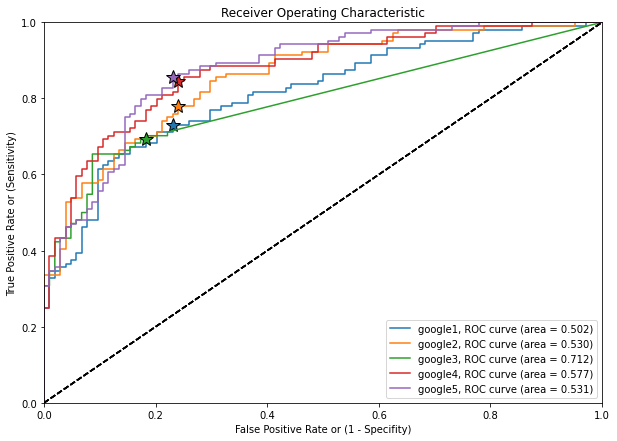

In [299]:
fig, ax = plt.subplots(figsize=(10, 7))

for i, m in enumerate(model_names):
    plot_roc(y_true, scores[m], label=m, show_fig=False)
    tpr, fpr = get_tpr_fpr(y_true, scores[m], thresh=model_threshes[m])
    plt.plot(fpr, tpr, 'C{}*'.format(i), mec='k', ms=15)
fig.show();

## Sip score distribution comparison

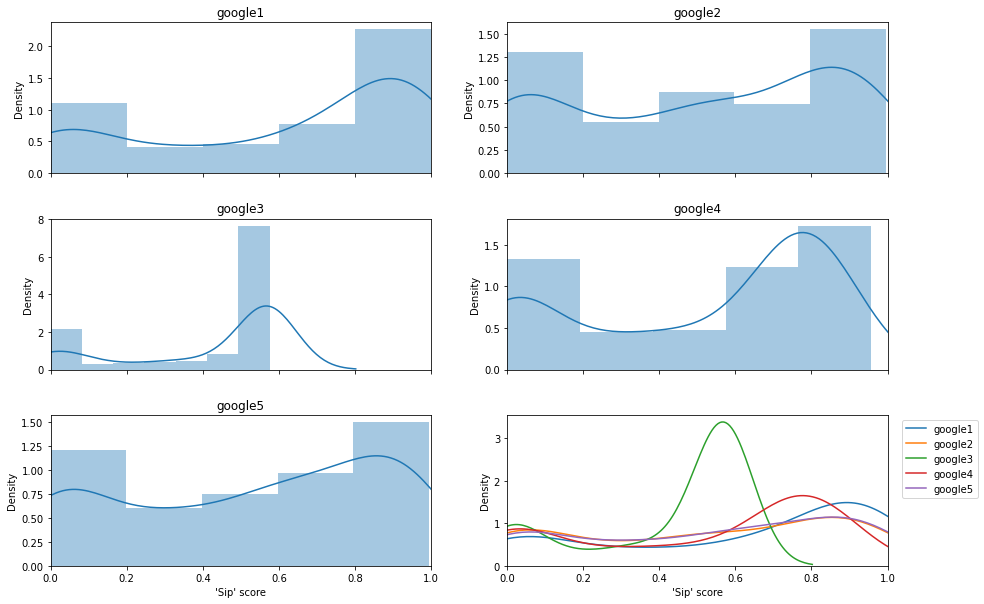

In [300]:
fig, ax = plt.subplots(3, 2, figsize=(15, 10), sharex=True)
for i, m in enumerate(model_names):
    sns.distplot(scores[m], hist=True, label=m, ax=ax[i // 2][i % 2])
    ax[i // 2][i % 2].set_title("google{}".format(i + 1))

for m in model_names:
    # sns.distplot(scores[m], bins=7, hist=True, kde=False, label=m, ax=ax[-1][-1])
    sns.distplot(scores[m], hist=False, label=m, ax=ax[-1][-1])

plt.xlim(0, 1)
fig.subplots_adjust(hspace=0.3)
plt.legend(bbox_to_anchor=(1.25, 1))

ax[-1][0].set_xlabel("'Sip' score")
ax[-1][1].set_xlabel("'Sip' score")

fig.show();

## Summary statistics

In [301]:
# Get the classification report for all models
statistics = {}
for m in model_names:
    statistics[m] = classification_report(y_true=y_true,
                                          y_pred=preds[m],
                                          target_names=validation_generator_pp.class_indices.keys(),
                                          output_dict=True)
np.save('model_comparison/validation_statistics.npy', statistics)

# Convert the classification report into a dataframe
df = pd.DataFrame(index=model_names)
df['accuracy'] = [statistics[m]['accuracy'] for m in model_names]
df['sip_precision'] = [statistics[m]['sip']['precision'] for m in model_names]
df['sip_recall'] = [statistics[m]['sip']['recall'] for m in model_names]
df.to_csv('model_comparison/acc_prec_rec_df.csv')
print("Statistics saved.")

Statistics saved.


In [302]:
# Load statistics
statistics = np.load('model_comparison/validation_statistics.npy', allow_pickle=True)[()]
df = pd.read_csv('model_comparison/acc_prec_rec_df.csv', index_col=0)

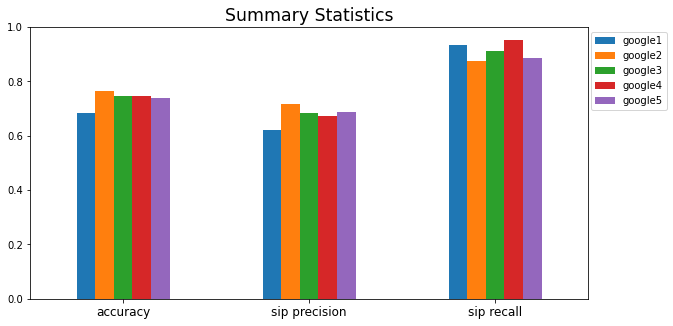

In [303]:
fig, ax = plt.subplots(figsize=(10, 5))
df.T.plot(kind="bar", ax=ax, legend=None)

ax.legend(bbox_to_anchor=(1.15, 1))
ax.set_title("Summary Statistics", fontsize="xx-large")
ax.set_xticklabels(['accuracy', 'sip precision', 'sip recall'], fontsize='large', rotation=0)
plt.ylim(0, 1)
plt.show();

## Same-Person Variability

In [304]:
# Specify the directory containing the images
img_dir = '../friends/face_only'

# Get all file paths in that directory
file_paths = glob.glob(img_dir + '/*.jpg')
print("{} images found.".format(len(file_paths)))

# Get the "names" of people (assumes image path is 'name1.jpg', 'name2.jpg', ...)
names = [fp.split('/')[-1].split('.')[0][:-1] for fp in file_paths]

# Only keep names with 5 instances
names, counts = np.unique(names, return_counts=True)
names = names[counts == 5]
print("{} names found.".format(len(names)))

72 images found.
14 names found.


In [305]:
# Specify a name and model to use
name = names[0]

means, stds, ranges, purities = [], [], [], []
for name in names:
    # Load images of the specified person
    print("Using name: {}".format(name))
    img_paths = glob.glob(img_dir + '/' + name + '*.jpg')
    named_images = load_image_set(img_paths, face_only=False, verbose=False)
    # print("Done.")

    # Preprocess images
    generator_pp = prepare_inputs(named_images, preprocess=True)

    # Get statistics for google1, which takes unprocessed data
    name_means, name_stds, name_ranges, name_purities = [], [], [], []
    m, s, r, p = get_name_variability(name, model=models['google1'], thresh=model_threshes['google1'], img_dir=img_dir, preprocess=False)
    name_means.append(m)
    name_stds.append(s)
    name_ranges.append(r)
    name_purities.append(p)

    # Get statistics for the rest of the models, which take processed data
    results = [get_name_variability(name, model=models[m], thresh=model_threshes[m], img_dir=img_dir, generator=generator_pp) for m in model_names[1:]]
    for i in range(len(results)):
        name_means.append(results[i][0])
        name_stds.append(results[i][1])
        name_ranges.append(results[i][2])
        name_purities.append(results[i][3])

    # Add statistics for this name to the rest of the results
    means.append(name_means)
    stds.append(name_stds)
    ranges.append(name_ranges)
    purities.append(name_purities)

# Convert to numpy arrays and save
means = np.array(means)
stds = np.array(stds)
ranges = np.array(ranges)
purities = np.array(purities)

np.save('model_comparison/variability_means.npy', means)
np.save('model_comparison/variability_stds.npy', stds)
np.save('model_comparison/variability_ranges.npy', ranges)
np.save('model_comparison/variability_purities.npy', purities)
print("\nSaved all results.")

# Create dataframe of result averages
df = pd.DataFrame(index=model_names)
df['avg_std'] = stds.mean(axis=0)
df['avg_range'] = ranges.mean(axis=0)
df['avg_purity'] = purities.mean(axis=0)
df.to_csv('model_comparison/variability_df.csv')
print("Saved dataframe.")

Using name: abby
Using name: becca
Using name: camryn
Using name: christina
Using name: emily
Using name: felicia
Using name: jasmine
Using name: joanna
Using name: julia
Using name: kelsea
Using name: larock
Using name: lauren
Using name: madi
Using name: michelle

Saved all results.
Saved dataframe.


In [306]:
# Load variability results
means = np.load('model_comparison/variability_means.npy')
std = np.load('model_comparison/variability_stds.npy')
ranges = np.load('model_comparison/variability_ranges.npy')
purities = np.load('model_comparison/variability_purities.npy')
df = pd.read_csv('model_comparison/variability_df.csv', index_col=0)

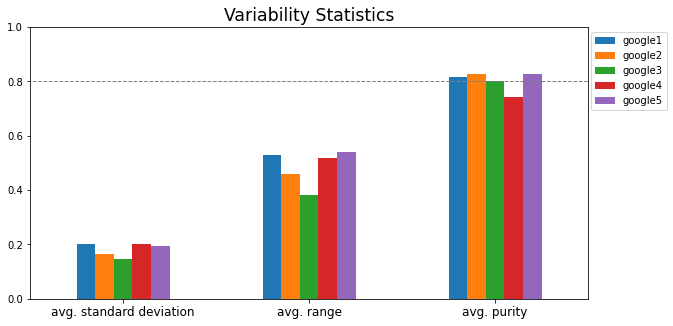

In [307]:
fig, ax = plt.subplots(figsize=(10, 5))
df.T.plot(kind="bar", ax=ax, legend=None)

ax.legend(bbox_to_anchor=(1.15, 1))
ax.set_title("Variability Statistics", fontsize="xx-large")
ax.set_xticklabels(['avg. standard deviation', 'avg. range', 'avg. purity'], fontsize='large', rotation=0)

plt.hlines(0.8, -1, 3, 'gray', linestyles='--', linewidth=1)
plt.ylim(0, 1)
plt.show();

## Individual Score comparison

In [31]:
# Load scores, preds, and labels
scores = np.load('model_comparison/validation_scores.npy', allow_pickle=True)[()]
preds = np.load('model_comparison/validation_preds.npy', allow_pickle=True)[()]
labels = np.load('model_comparison/validation_labels.npy', allow_pickle=True)[()]

# Load statistics
statistics = np.load('model_comparison/validation_statistics.npy', allow_pickle=True)[()]
df = pd.read_csv('model_comparison/acc_prec_rec_df.csv')

In [115]:
# Load and process all validation images
test_paths = glob.glob('data/test/*/*.jpg')
X_test = load_image_set(test_paths, face_only=False, verbose=False)
X_test_pp = prepare_inputs(X_test, preprocess=True)

# Get true labels
y_true = ['skip' in path for path in test_paths]

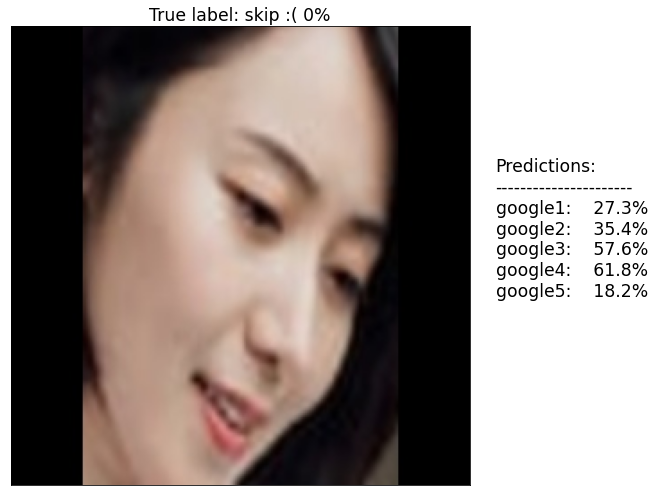

In [134]:
plot_predictions(X_test, y_true=y_true, scores=scores, num_to_plot=1)

In [228]:
plot_predictions(X_test, scores=scores, num_to_plot=24)

Output hidden; open in https://colab.research.google.com to view.

In [92]:
cd ..

/content/drive/My Drive/Cafe


# Model Evaluation

## Evaluate on `Friends` dataset

In [5]:
cd google_scrape

/content/drive/My Drive/Cafe/google_scrape


In [8]:
friends = load_image_set('../friends/face_only', face_only=False)

Loading 72 images...
	Loading image 10/72
	Loading image 20/72
	Loading image 30/72
	Loading image 40/72
	Loading image 50/72
	Loading image 60/72
	Loading image 70/72


In [6]:
model_dir = "google2"

model_names = ["google1", "google2", "google3", "google4", "google5"]
model = keras.models.load_model(model_dir + "/tuned")

threshes = [0.28, 0.44, 0.45, 0.29, 0.37]
thresh = threshes[model_names.index(model_dir)]

In [9]:
# Preprocess images
friends_pp = prepare_inputs(friends, preprocess=True)

# Predict image labels (0 = sip, 1 = skip)
output = model(friends_pp)
scores, preds, labels = process_results(output, thresh)

In [71]:
n_cols = 5
for friend in range(len(friends) // n_cols):
# for friend in range(2):
    fig, ax = plt.subplots(1, n_cols+1, figsize=(20, 5))
    for i in range(n_cols):
        idx = i + friend*n_cols
        img = friends[idx]

        ax[i].imshow(img)
        ax[i].set_title("Prediction: {}  {:.2%}".format(labels[idx], scores[idx]))
        ax[i].set_xticks([])
        ax[i].set_yticks([])

    avg_score = sum(scores[friend*n_cols: friend*n_cols + 5]) / n_cols
    if avg_score >= thresh:
        avg_label = 'Sip!\n{:.2%}'.format(avg_score)
    else:
        avg_label = 'Skip :(\n{:.2%}'.format(avg_score)

    ax[-1].imshow(np.zeros((256, 256)), alpha=0)
    ax[-1].text(128, 128, avg_label, fontsize='xx-large', horizontalalignment='center', verticalalignment='center')
    ax[-1].set_xticks([])
    ax[-1].set_yticks([])

    fig.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

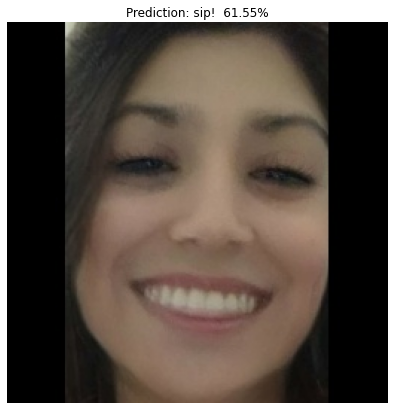

In [255]:
idx = -1
img = friends[idx]

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
ax.imshow(img)
ax.set_title("Prediction: {}  {:.2%}".format(labels[idx], scores[idx]))
ax.set_axis_off()

## Validation

In [208]:
cd google_scrape

/content/drive/My Drive/Cafe/google_scrape


In [285]:
# Specify model to use
model_dir = "google5"

# Load model and set threshold
model_names = ["google1", "google2", "google3", "google4", "google5"]
model = keras.models.load_model(model_dir + "/tuned")

thresh = model_threshes[model_dir]

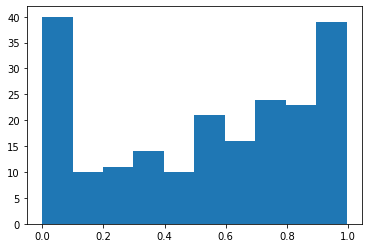

In [292]:
# Get true labels
y_true = model_generators_val[model_dir].classes

# Predict each image
output = model.predict(model_generators_val[model_dir], steps=10)
y_score, y_preds, y_labels = process_results(output, thresh)

# Plot histogram of sip scores
plt.hist(y_score)
plt.show();

In [293]:
# Print out confusion matrix
cm = confusion_matrix(y_true, y_preds) #, normalize='pred')
cm = pd.DataFrame(cm, columns=["Pred sip", "Pred skip"], index=["True sip", "True skip"])
print(cm)

           Pred sip  Pred skip
True sip         91         13
True skip        41         63


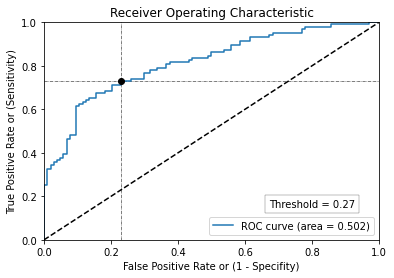

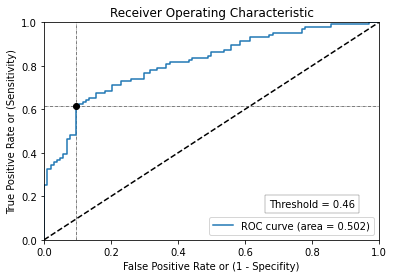

In [268]:
# Plot the ROC curve and mark where the threshold for matching is 0.2 and 0.5
plot_roc(y_true, y_score, thresh=thresh)
plot_roc(y_true, y_score, thresh=0.5)

Actual:     skip :(
Prediction: skip :(  40.05%


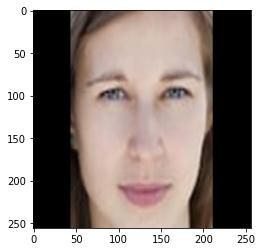

In [221]:
i = np.random.choice(len(y_true))
print("Actual:     {}".format(class_labels[y_true[i]]))
print("Prediction: {}  {:.2%}".format(class_labels[y_preds[i]], y_score[i]))
plt.imshow(X_test[i])
plt.show();

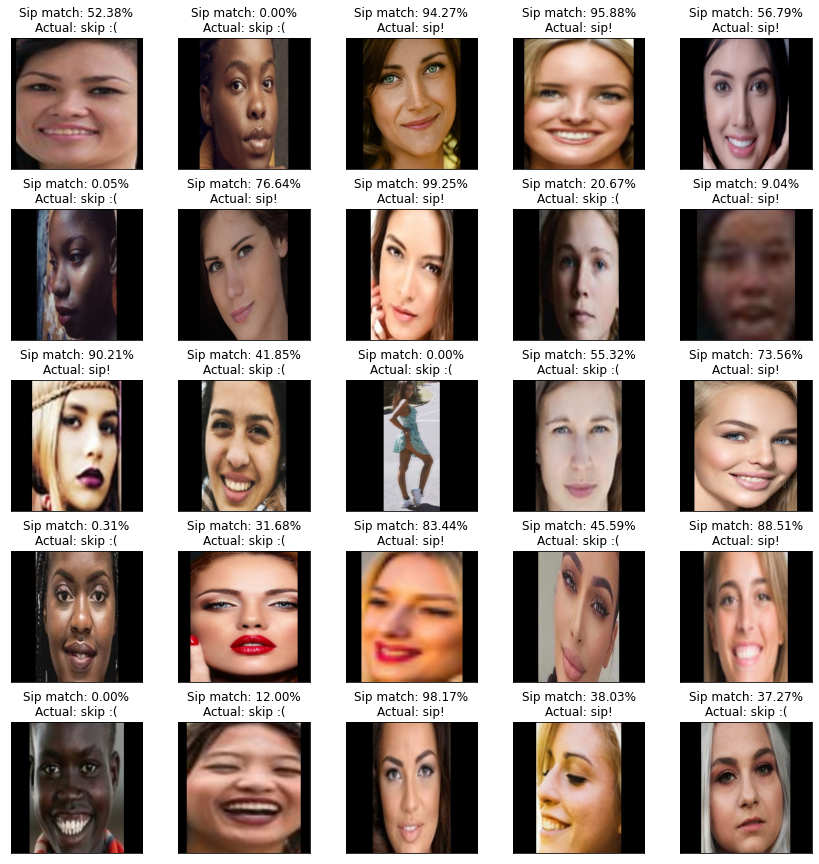

In [ ]:
display_many(test_paths, results=(y_score, y_true), randomize=True)

# Layer-wise Relevence Propagation

https://github.com/atulshanbhag/Layerwise-Relevance-Propagation

In [ ]:
cd google_scrape

/content/drive/My Drive/Classes/CISC 889/google_scrape


In [ ]:
model_dir = "google4"
model = keras.models.load_model(model_dir + "/tuned")

In [ ]:
from matplotlib.cm import get_cmap
from keras import backend as K
from tensorflow.python.ops import gen_nn_ops

EPS = 1e-7

In [ ]:
# Set parameters
batch_size = 32
preprocess = True

# derive the paths to the training and validation directories
train_path = "data/train"
validation_path = "data/test"

# Load training and validation generators (_pp = preprocesses, _un = unprocessed)
train_generator, validation_generator = load_generators(train_path, validation_path, batch_size=batch_size, preprocess=True)

Found 832 images belonging to 2 classes.
Found 208 images belonging to 2 classes.


In [ ]:
test_paths = validation_generator.filenames
test_paths = ["data/test/" + p for p in test_paths]

X_test = load_image_set(test_paths, face_only=False)
X_test_pp = prepare_inputs(X_test, preprocess=True)

y_true = validation_generator.classes

Loading 208 images...
	Loading image 10/208
	Loading image 20/208
	Loading image 30/208
	Loading image 40/208
	Loading image 50/208
	Loading image 60/208
	Loading image 70/208
	Loading image 80/208
	Loading image 90/208
	Loading image 100/208
	Loading image 110/208
	Loading image 120/208
	Loading image 130/208
	Loading image 140/208
	Loading image 150/208
	Loading image 160/208
	Loading image 170/208
	Loading image 180/208
	Loading image 190/208
	Loading image 200/208


In [ ]:
def get_model_params(model):
  names, activations, weights = [], [], []
  for layer in model.layers:
    name = layer.name if layer.name != 'predictions' else 'fc_out'
    names.append(name)
    activations.append(layer.output)
    weights.append(layer.get_weights())
  return names, activations, weights


def gamma_correction(image, gamma=0.4, minamp=0, maxamp=None):
  c_image = np.zeros_like(image)
  image -= minamp
  if maxamp is None:
    maxamp = np.abs(image).max() + EPS
  image /= maxamp
  pos_mask = (image > 0)
  neg_mask = (image < 0)
  c_image[pos_mask] = np.power(image[pos_mask], gamma)
  c_image[neg_mask] = -np.power(-image[neg_mask], gamma)
  c_image = c_image * maxamp + minamp
  return c_image

def project_image(image, output_range=(0, 1), absmax=None, input_is_positive_only=False):
  if absmax is None:
    absmax = np.max(np.abs(image), axis=tuple(range(1, len(image.shape))))
  absmax = np.asarray(absmax)
  mask = (absmax != 0)
  if mask.sum() > 0:
    image[mask] /= absmax[mask]
  if not input_is_positive_only:
    image = (image + 1) / 2
  image = image.clip(0, 1)
  projection = output_range[0] + image * (output_range[1] - output_range[0])
  return projection

def reduce_channels(image, axis=-1, op='sum'):
  if op == 'sum':
    return image.sum(axis=axis)
  elif op == 'mean':
    return image.mean(axis=axis)
  elif op == 'absmax':
    pos_max = image.max(axis=axis)
    neg_max = -((-image).max(axis=axis))
    return np.select([pos_max >= neg_max, pos_max < neg_max], [pos_max, neg_max])

def heatmap(image, cmap_type='rainbow', reduce_op='sum', reduce_axis=-1, **kwargs):
  cmap = get_cmap(cmap_type)
  shape = list(image.shape)
  reduced_image = reduce_channels(image, axis=reduce_axis, op=reduce_op)
  projected_image = project_image(reduced_image, **kwargs)
  heatmap = cmap(projected_image.flatten())[:, :3].T
  heatmap = heatmap.T
  shape[reduce_axis] = 3
  return heatmap.reshape(shape)

def get_gammas(images, g=0.4, **kwargs):
  gammas = [gamma_correction(img, gamma=g, **kwargs) for img in images]
  return gammas

def get_heatmaps(gammas, cmap_type='rainbow', **kwargs):
  heatmaps = [heatmap(g, cmap_type=cmap_type, **kwargs) for g in gammas]
  return heatmaps

class LayerwiseRelevancePropagation:

  def __init__(self, model, alpha=2, epsilon=1e-7):

    # model_type = VGG16
    # self.model = model_type(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
    self.model = model

    self.alpha = alpha
    self.beta = 1 - alpha
    self.epsilon = epsilon

    self.names, self.activations, self.weights = get_model_params(self.model)
    self.num_layers = len(self.names)

    self.relevance = self.compute_relevances()
    self.lrp_runner = K.function(inputs=[self.model.input, ], outputs=[self.relevance, ])

  def compute_relevances(self):
    r = self.model.output
    for i in range(self.num_layers-2, -1, -1):
      if 'dense' in self.names[i + 1]:
        r = self.backprop_fc(self.weights[i + 1][0], self.weights[i + 1][1], self.activations[i], r)
      elif 'flatten' in self.names[i + 1]:
        r = self.backprop_flatten(self.activations[i], r)
      elif 'pool' in self.names[i + 1]:
        r = self.backprop_max_pool2d(self.activations[i], r)
      elif 'conv' in self.names[i + 1]:
        r = self.backprop_conv2d(self.weights[i + 1][0], self.weights[i + 1][1], self.activations[i], r)
      elif 'dropout' in self.names[i + 1]:
          continue
      else:
        raise 'Layer not recognized!'
        sys.exit()
    return r

  def backprop_fc(self, w, b, a, r):
    w_p = K.maximum(w, 0.)
    b_p = K.maximum(b, 0.)
    z_p = K.dot(a, w_p) + b_p + self.epsilon
    s_p = r / z_p
    c_p = K.dot(s_p, K.transpose(w_p))
    
    w_n = K.minimum(w, 0.)
    b_n = K.minimum(b, 0.)
    z_n = K.dot(a, w_n) + b_n - self.epsilon
    s_n = r / z_n
    c_n = K.dot(s_n, K.transpose(w_n))

    return a * (self.alpha * c_p + self.beta * c_n)

  def backprop_flatten(self, a, r):
    shape = a.get_shape().as_list()
    shape[0] = -1
    return K.reshape(r, shape)

  def backprop_max_pool2d(self, a, r, ksize=(1, 2, 2, 1), strides=(1, 2, 2, 1)):
    z = K.pool2d(a, pool_size=ksize[1:-1], strides=strides[1:-1], padding='valid', pool_mode='max')

    z_p = K.maximum(z, 0.) + self.epsilon
    s_p = r / z_p
    c_p = gen_nn_ops.max_pool_grad_v2(a, z_p, s_p, ksize, strides, padding='VALID')

    z_n = K.minimum(z, 0.) - self.epsilon
    s_n = r / z_n
    c_n = gen_nn_ops.max_pool_grad_v2(a, z_n, s_n, ksize, strides, padding='VALID')

    return a * (self.alpha * c_p + self.beta * c_n)

  def backprop_conv2d(self, w, b, a, r, strides=(1, 1, 1, 1)):
    w_p = K.maximum(w, 0.)
    b_p = K.maximum(b, 0.)
    z_p = K.conv2d(a, kernel=w_p, strides=strides[1:-1], padding='same') + b_p + self.epsilon
    s_p = r / z_p
    # c_p = K.tf.nn.conv2d_backprop_input(K.shape(a), w_p, s_p, strides, padding='SAME')
    c_p = tf.compat.v1.nn.conv2d_backprop_input(K.shape(a), w_p, s_p, strides, padding='SAME')

    w_n = K.minimum(w, 0.)
    b_n = K.minimum(b, 0.)
    z_n = K.conv2d(a, kernel=w_n, strides=strides[1:-1], padding='same') + b_n - self.epsilon
    s_n = r / z_n
    # c_n = K.tf.nn.conv2d_backprop_input(K.shape(a), w_n, s_n, strides, padding='SAME')
    c_n = tf.compat.v1.nn.conv2d_backprop_input(K.shape(a), w_n, s_n, strides, padding='SAME')

    return a * (self.alpha * c_p + self.beta * c_n)

  def predict_labels(self, images):
    return predict_labels(self.model, images)

  def run_lrp(self, images):
    print("Running LRP on {0} images...".format(len(images)))
    return self.lrp_runner([images, ])[0]

  def compute_heatmaps(self, images, g=0.2, cmap_type='rainbow', **kwargs):
    lrps = self.run_lrp(images)
    print("LRP run successfully...")
    gammas = get_gammas(lrps, g=g, **kwargs)
    print("Gamma Correction completed...")
    heatmaps = get_heatmaps(gammas, cmap_type=cmap_type, **kwargs)
    return heatmaps

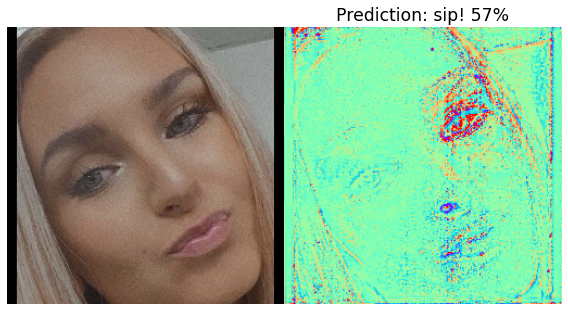

In [ ]:
idx = 12
img = friends[idx]
hmap = heatmaps[idx]
s = scores[idx]
p = preds[idx]
visualize_heatmap(img, hmap, s, p)

In [ ]:
raw_images, processed_images = friends, friends_pp
print("Images loaded.")

lrp = LayerwiseRelevancePropagation(model)
output = model(friends_pp)
scores, preds, labels = process_results(output, thresh)
print("Labels predicted.")

heatmaps = lrp.compute_heatmaps(processed_images)
print("Heatmaps generated.")

Images loaded.
Labels predicted.
Running LRP on 46 images...
LRP run successfully...
Gamma Correction completed...
Heatmaps generated.


In [ ]:
for img, hmap, s, p in zip(raw_images, heatmaps, scores, preds):
    visualize_heatmap(img, hmap, s, p)

Output hidden; open in https://colab.research.google.com to view.

# END